<span style="color:red; font-family:Helvetica Neue, Helvetica, Arial, sans-serif; font-size:2em;">An Exception was encountered at '<a href="#papermill-error-cell">In [25]</a>'.</span>

# Image Captioning on the Flicker8k Dataset

This notebook provides you with a rough structure for the Mini-Challenge on the topic of Image Captioning from the Deep Learning MSE course. Please make sure to follow the Project Setup steps to ensure reproducable results. Additionally familiarize yourself with the grading structure and project submission guidelines in the _DL-MPW-ImgCaptioning.pdf_ document. There you'll find all the information you should need. 

If you have any questions please contact roman.studer@fhnw.ch

###  Team Name and Members
<span style="color: red;"><strong>TODO:</strong> Add your teamname and add the names of your team members</span>


### Some Guidelines

- You are allowed to use generative models (e.g. ChatGPT, Claude etc.) for code completion or suggestions. However, we require you to perfectly understand and control the code. 
- You are **not** allowed to use the same or similar generative models for providing reflection on the achieved results. __You__ must reflect about what you see and build your own opinion about it.
- You are allowed to create additional python scripts to outsource code snippets to improve readability.

## Project Setup


### 1. Create the virtual environment

Create a new environment and install the necessary dependencies listed in `requirements.txt`. Make sure you can import the libraries in the code cell below and that yout pytorch installation can run on your GPU.

In [1]:
# [batch] package install skipped (prepared on login node)


In [2]:
!nvidia-smi

Mon Jun  1 15:23:01 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.126.20             Driver Version: 580.126.20     CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          On  |   00000000:B7:00.0 Off |                    0 |
| N/A   31C    P0             57W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [3]:
# imports
import textwrap
import math
import copy
from pathlib import Path
from collections import defaultdict
import kagglehub
import shutil
import os

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torchvision import transforms
from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction

from dataloader import (
    build_tokenizer_from_split,
    create_caption_dataloader,
    build_captions_map,
    load_split_dataframe,
    load_split_image_ids,
)
from tokenizer import tokenize, CaptionTokenizer

print("torch version:", torch.__version__)
print("torchvision version:", torchvision.__version__)

torch version: 2.12.0+cu130
torchvision version: 0.27.0+cu130


### 2. Download the dataset
The Flickr8k dataset used in this challenge is available under [Flickr 8k Dataset - Kaggle](https://www.kaggle.com/datasets/adityajn105/flickr8k). In the zip folder on Moodle you find the basic structure with `captions.txt` and the `data/splits`-folder, but without images in the `data/images`-folder. Make sure to download all the images and placing them in the folder `data/images/`. 
The train test split is already provided for you and handled by the provided `dataloader.py` script. Test and train split image lists and corresponding captions are located in the `data/splits/` folder. Don't modify this split.

<img src="data_structure.png"/>

In [4]:
# [batch] dataset assumed pre-staged in ./data - download skipped
import os
target_dir = os.path.join(os.getcwd(), 'data')
print('[batch] using dataset at', target_dir)


[batch] using dataset at /cluster/home/magilolg/neural-image-captioning-main/captioning_starter/data


## Dataloader, Tokenizer

The repository includes a `Dataset`-class (`Flickr8kCaptionsDatasetBase`) and `DataLoader`'s that are based on this specific structure of the data directory. You can use `create_caption_dataloader` for obtaining instances for the train and test data loaders. You can configure it with the `tokenizer` provided in the repo. The `tokenizer` performs some preprocessing steps of the captions. It also creates a vocabulary from the training data and then provides a mapping from the words to tokens. Note that there are also some special tokens introduced that are important when processing the captions during training or generating the captions during inference:
| Word    | ID | Role |
| --------| ---|----- |
| `<pad>`  | 0 | padding for filling up sequence to a given length in a mini-batch. | 
| `<bos>`  | 1 | beginning of sentence - each tokenized sentence should start with `<bos>`, i.e. also the generated ones. | 
| `<eos>`  | 2 | end of sentence - for fixed length captions will signal that the rest will consist of `<pad>`-tokens only. | 
| `<unk>`  | 3 | unknown - not available in vocabulary | 

Furthermore, specify your transforms used for preprocessing and augmenting the images and pass them to the `create_caption_dataloader`-method.
The mini-batches created by the dataloader have the following structure: `(images, captions, lengths, image_ids, raw_captions)`. Captions are built from the training vocabulary only, and `lengths` may let you mask padding tokens in the loss.


In [5]:
# Transforms
IMAGENET_SIZE = 224
IMAGENET_MEAN = (0.485, 0.456, 0.406)
IMAGENET_STD  = (0.229, 0.224, 0.225)

def _convert_to_rgb(image: Image.Image) -> Image.Image:
    return image.convert("RGB")

def build_train_transforms() -> transforms.Compose:
    """Training transforms with data augmentation for regularisation."""
    return transforms.Compose([
        transforms.Lambda(_convert_to_rgb),
        # Data augmentation: helps generalisation on small dataset
        transforms.RandomResizedCrop(IMAGENET_SIZE, scale=(0.65, 1.0), ratio=(0.75, 1.33)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
        transforms.RandomGrayscale(p=0.05),
        transforms.ToTensor(),
        transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ])

def build_test_transforms() -> transforms.Compose:
    """Deterministic test transforms — no augmentation."""
    return transforms.Compose([
        transforms.Lambda(_convert_to_rgb),
        transforms.Resize(256),
        transforms.CenterCrop(IMAGENET_SIZE),
        transforms.ToTensor(),
        transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ])

def denormalize_image(image: torch.Tensor) -> torch.Tensor:
    """Undo ImageNet normalisation for visualisation."""
    mean_t = image.new_tensor(IMAGENET_MEAN).view(-1, 1, 1)
    std_t  = image.new_tensor(IMAGENET_STD).view(-1, 1, 1)
    return (image * std_t + mean_t).clamp(0, 1)

In [6]:
# TODO: ADJUST PATH TO data_dir IF NEEDED
data_dir = target_dir

import os
MIN_WORD_FREQ = 5
MAX_LEN       = 40
BATCH_SIZE    = 512                                    # L40S has 46GB — plenty of room
NUM_WORKERS   = min(8, (os.cpu_count() or 4))           # parallel data loading


In [7]:
# Build vocabulary from training captions only (no test leakage).
tokenizer = build_tokenizer_from_split(split="train", data_dir=data_dir, min_freq=MIN_WORD_FREQ)

# create_caption_dataloader (from dataloader.py) accepts num_workers and
# pin_memory; it sets persistent_workers=True internally when num_workers > 0
# and uses PyTorch's default prefetch_factor.
train_loader = create_caption_dataloader(
    split="train",
    data_dir=data_dir,
    tokenizer=tokenizer,
    transform=build_train_transforms(),
    batch_size=BATCH_SIZE,
    max_len=MAX_LEN,
    caption_sampling="all",
    num_workers=NUM_WORKERS,
    pin_memory=True,
)
test_loader = create_caption_dataloader(
    split="test",
    data_dir=data_dir,
    tokenizer=tokenizer,
    transform=build_test_transforms(),
    batch_size=BATCH_SIZE,
    max_len=MAX_LEN,
    caption_sampling="random",
    num_workers=NUM_WORKERS,
    pin_memory=True,
)

# Build reference captions map for BLEU evaluation
test_captions_df  = load_split_dataframe("test", data_dir)
test_captions_map = build_captions_map(test_captions_df)

images, captions, lengths, image_ids, raw_captions = next(iter(train_loader))

print(f"Vocabulary size:                {len(tokenizer):,}")
print(f"Number of training examples:    {len(train_loader.dataset):,}")
print(f"Batch image tensor shape:       {tuple(images.shape)}")
print(f"Batch caption tensor shape:     {tuple(captions.shape)}")
print(f"Caption lengths in first batch: {lengths.tolist()[:6]} ...")
print(f"DataLoader workers:             {train_loader.num_workers}")
print(f"DataLoader pin_memory:          {train_loader.pin_memory}")
print(f"DataLoader persistent_workers:  {train_loader.persistent_workers}")

images, captions, lengths, image_ids, raw_captions = next(iter(test_loader))
print(f"Number of test examples:        {len(test_loader.dataset):,}")
print(f"Batch image tensor shape:       {tuple(images.shape)}")


Vocabulary size:                2,649
Number of training examples:    32,365
Batch image tensor shape:       (512, 3, 224, 224)
Batch caption tensor shape:     (512, 40)
Caption lengths in first batch: [10, 13, 9, 10, 8, 16] ...
DataLoader workers:             8
DataLoader pin_memory:          True
DataLoader persistent_workers:  True


Number of test examples:        1,618
Batch image tensor shape:       (512, 3, 224, 224)


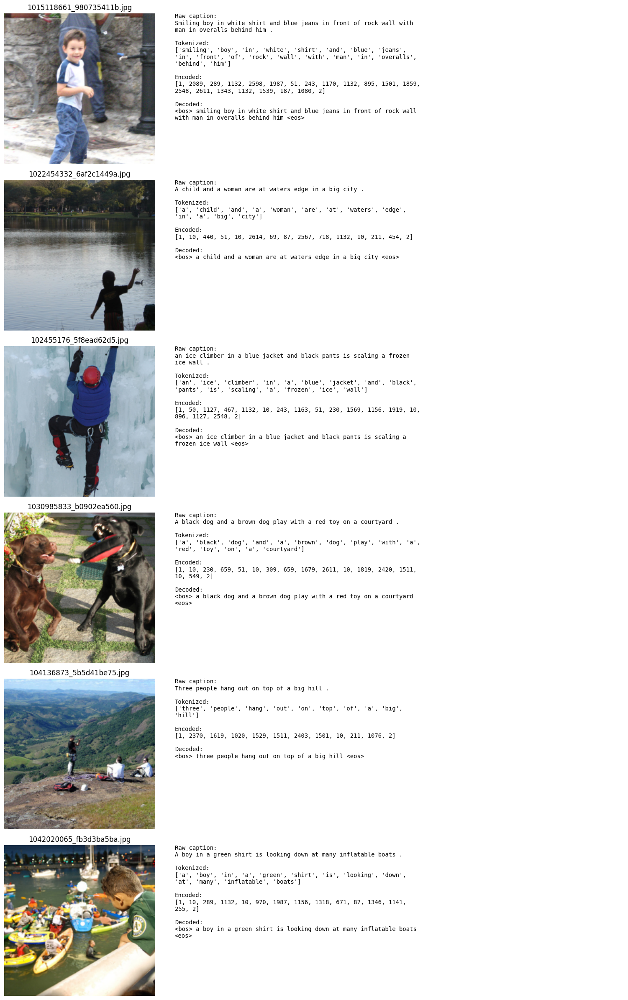

In [8]:
# Visualise a few samples from the test loader
num_examples = 6
n = min(num_examples, len(images))

fig, axes = plt.subplots(
    nrows=n,
    ncols=2,
    figsize=(16, 4 * n),
    gridspec_kw={"width_ratios": [1.1, 2.2]},
)

if n == 1:
    axes = [axes]

for idx in range(n):
    image = denormalize_image(images[idx].detach().cpu()).permute(1, 2, 0)

    encoded_caption  = captions[idx, : int(lengths[idx])].tolist()
    tokenized_caption = tokenize(raw_captions[idx])
    decoded_caption   = tokenizer.decode(encoded_caption, skip_special_tokens=False)

    ax_image, ax_text = axes[idx]
    ax_image.imshow(image)
    ax_image.set_title(image_ids[idx])
    ax_image.axis("off")

    caption_details = "\n\n".join([
        f"Raw caption:\n{textwrap.fill(raw_captions[idx], width=70)}",
        f"Tokenized:\n{textwrap.fill(str(tokenized_caption), width=70)}",
        f"Encoded:\n{textwrap.fill(str(encoded_caption), width=70)}",
        f"Decoded:\n{textwrap.fill(decoded_caption, width=70)}",
    ])

    ax_text.axis("off")
    ax_text.text(0, 1, caption_details, va="top", ha="left", fontsize=10, family="monospace")

plt.tight_layout()
plt.show()

## Shared Utilities

Use this section for shared config and helper functions reused across all experiments. For example define a common training loop, BLEU computation or visualisation helpers here. This way your model models stay directly comparable.


In [9]:
# ── Device ─────────────────────────────────────────────────────────────────
DEVICE = (
    torch.device("cuda") if torch.cuda.is_available()
    else torch.device("mps") if torch.backends.mps.is_available()
    else torch.device("cpu")
)
print("device:", DEVICE)

PAD_IDX = tokenizer.pad_idx  # == 0

import time
from tqdm.auto import tqdm

# Speed knobs --------------------------------------------------------------
# cudnn.benchmark picks the fastest conv algo for our (fixed) input size.
# AMP (mixed precision) gives ~2× speedup on Ada/Ampere/Hopper GPUs.
USE_AMP = (DEVICE.type == "cuda")
if DEVICE.type == "cuda":
    torch.backends.cudnn.benchmark = True
    # bf16 on Ada/Ampere/Hopper avoids the GradScaler overhead; fp16 elsewhere.
    AMP_DTYPE = torch.bfloat16 if torch.cuda.is_bf16_supported() else torch.float16
else:
    AMP_DTYPE = torch.float32
print(f"AMP enabled: {USE_AMP} (dtype={AMP_DTYPE})")

# ── Weights & Biases experiment tracking (opt-in) ──────────────────────────
# Set USE_WANDB = True to log per-epoch metrics to a wandb project.
# Requires `pip install wandb` and a `wandb login` once.
USE_WANDB     = True
WANDB_PROJECT = "flickr8k-captioning"
WANDB_ENTITY  = "zhaw-deep-learning"   # your wandb username/team, or None for default

try:
    import wandb
    _WANDB_AVAILABLE = True
except ImportError:
    _WANDB_AVAILABLE = False
    if USE_WANDB:
        print("⚠ USE_WANDB=True but `wandb` is not installed. "
              "Run `pip install wandb` and `wandb login` to enable, "
              "or set USE_WANDB=False. Logging disabled for now.")
        USE_WANDB = False


# ── Loss helper ─────────────────────────────────────────────────────────────
def masked_cross_entropy(logits: torch.Tensor, targets: torch.Tensor, pad_idx: int = 0) -> torch.Tensor:
    """Average cross-entropy over non-padding positions."""
    B, T, V = logits.shape
    return F.cross_entropy(logits.reshape(-1, V), targets.reshape(-1), ignore_index=pad_idx)


# ── Training loop (mixed precision) ────────────────────────────────────────
def train_one_epoch(encoder, decoder, dataloader, optimizer, device,
                    pad_idx=0, epoch=None, n_epochs=None, model_name="model",
                    scaler=None):
    """One epoch of training with AMP, per-batch progress, grad-norm, timing."""
    encoder.train(); decoder.train()
    total_loss, total_tokens_correct, total_tokens = 0.0, 0, 0
    grad_norms = []
    t0 = time.time()

    pbar = tqdm(
        dataloader,
        desc=f"[{model_name}] Epoch {epoch}/{n_epochs}",
        leave=False, dynamic_ncols=True,
    )

    use_scaler = (scaler is not None) and (AMP_DTYPE == torch.float16)

    for step, (images, captions, lengths, _, _) in enumerate(pbar, start=1):
        images   = images.to(device, non_blocking=True)
        captions = captions.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        if USE_AMP:
            with torch.autocast(device_type=device.type, dtype=AMP_DTYPE):
                features = encoder(images)
                logits   = decoder(features, captions)           # (B, T-1, V)
                targets  = captions[:, 1:]
                loss     = masked_cross_entropy(logits, targets, pad_idx)
        else:
            features = encoder(images)
            logits   = decoder(features, captions)
            targets  = captions[:, 1:]
            loss     = masked_cross_entropy(logits, targets, pad_idx)

        # Backward + clip + step
        if use_scaler:
            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            gnorm = nn.utils.clip_grad_norm_(
                list(encoder.parameters()) + list(decoder.parameters()), max_norm=5.0
            )
            scaler.step(optimizer)
            scaler.update()
        else:
            loss.backward()
            gnorm = nn.utils.clip_grad_norm_(
                list(encoder.parameters()) + list(decoder.parameters()), max_norm=5.0
            )
            optimizer.step()

        with torch.no_grad():
            preds = logits.argmax(-1)
            mask  = (targets != pad_idx)
            total_tokens_correct += (preds.eq(targets) & mask).sum().item()
            total_tokens         += mask.sum().item()

        total_loss += loss.item()
        grad_norms.append(float(gnorm))

        running_loss = total_loss / step
        running_acc  = total_tokens_correct / max(total_tokens, 1)
        pbar.set_postfix(
            loss=f"{loss.item():.3f}",
            avg=f"{running_loss:.3f}",
            acc=f"{running_acc:.2%}",
            gnorm=f"{float(gnorm):.2f}",
            lr=f"{optimizer.param_groups[0]['lr']:.2e}",
        )

    dt = time.time() - t0
    return {
        "loss":      total_loss / max(len(dataloader), 1),
        "acc":       total_tokens_correct / max(total_tokens, 1),
        "grad_mean": float(np.mean(grad_norms)) if grad_norms else 0.0,
        "grad_max":  float(np.max(grad_norms)) if grad_norms else 0.0,
        "time_s":    dt,
    }


# ── Validation (AMP) — loss + perplexity + token-acc in one pass ───────────
@torch.no_grad()
def evaluate_loss(encoder, decoder, dataloader, device, pad_idx=0):
    """Returns (mean per-batch loss, perplexity, teacher-forced token accuracy)."""
    encoder.eval(); decoder.eval()
    sum_loss_tok, n_tokens = 0.0, 0
    sum_loss_batch, n_batches = 0.0, 0
    correct = 0

    for images, captions, lengths, _, _ in dataloader:
        images   = images.to(device, non_blocking=True)
        captions = captions.to(device, non_blocking=True)

        if USE_AMP:
            with torch.autocast(device_type=device.type, dtype=AMP_DTYPE):
                features = encoder(images)
                logits   = decoder(features, captions)
        else:
            features = encoder(images)
            logits   = decoder(features, captions)

        # cast back to fp32 for stable loss accumulation
        logits  = logits.float()
        targets = captions[:, 1:]

        loss_sum = F.cross_entropy(
            logits.reshape(-1, logits.size(-1)),
            targets.reshape(-1),
            ignore_index=pad_idx, reduction="sum",
        )
        mask = (targets != pad_idx)
        ntok = mask.sum().item()

        sum_loss_tok   += loss_sum.item()
        n_tokens       += ntok
        sum_loss_batch += (loss_sum.item() / max(ntok, 1))
        n_batches      += 1
        correct        += (logits.argmax(-1).eq(targets) & mask).sum().item()

    ppl = math.exp(sum_loss_tok / max(n_tokens, 1))
    return sum_loss_batch / max(n_batches, 1), ppl, correct / max(n_tokens, 1)


# ── Perplexity (kept for backward compatibility) ───────────────────────────
@torch.no_grad()
def compute_perplexity(encoder, decoder, dataloader, device, pad_idx=0) -> float:
    _, ppl, _ = evaluate_loss(encoder, decoder, dataloader, device, pad_idx)
    return ppl


# ── BLEU ────────────────────────────────────────────────────────────────────
@torch.no_grad()
def compute_bleu(encoder, decoder, dataloader, tokenizer, device,
                 captions_map: dict, max_samples: int = 2000) -> dict:
    """Corpus BLEU-1..4 on generated captions vs all reference captions."""
    encoder.eval(); decoder.eval()
    references, hypotheses = [], []
    count = 0
    pbar = tqdm(dataloader, desc="BLEU", leave=False, dynamic_ncols=True)
    for images, captions, lengths, image_ids, raw_caps in pbar:
        if count >= max_samples:
            break
        images = images.to(device, non_blocking=True)
        if USE_AMP:
            with torch.autocast(device_type=device.type, dtype=AMP_DTYPE):
                features  = encoder(images)
                generated = decoder.generate(features, tokenizer, max_len=35)
        else:
            features  = encoder(images)
            generated = decoder.generate(features, tokenizer, max_len=35)
        for i in range(len(image_ids)):
            all_caps = captions_map.get(image_ids[i], [raw_caps[i]])
            references.append([tokenize(c) for c in all_caps])
            hyp_ids = generated[i].cpu().tolist()
            hyp_str = tokenizer.decode(hyp_ids, skip_special_tokens=True, stop_at_eos=True)
            hypotheses.append(tokenize(hyp_str))
        count += len(image_ids)
        pbar.set_postfix(samples=count)

    sf = SmoothingFunction().method1
    return {
        "BLEU-1": corpus_bleu(references, hypotheses, weights=(1,0,0,0), smoothing_function=sf),
        "BLEU-2": corpus_bleu(references, hypotheses, weights=(0.5,0.5,0,0), smoothing_function=sf),
        "BLEU-3": corpus_bleu(references, hypotheses, weights=(1/3,1/3,1/3,0), smoothing_function=sf),
        "BLEU-4": corpus_bleu(references, hypotheses, weights=(0.25,0.25,0.25,0.25), smoothing_function=sf),
    }


# ── Lightweight in-training caption preview ────────────────────────────────
@torch.no_grad()
def _print_sample_captions(encoder, decoder, test_loader, tokenizer, device, n=2):
    encoder.eval(); decoder.eval()
    images, captions, lengths, image_ids, raw_caps = next(iter(test_loader))
    images = images.to(device)
    if USE_AMP:
        with torch.autocast(device_type=device.type, dtype=AMP_DTYPE):
            features  = encoder(images)
            generated = decoder.generate(features, tokenizer, max_len=35)
    else:
        features  = encoder(images)
        generated = decoder.generate(features, tokenizer, max_len=35)
    for i in range(min(n, images.size(0))):
        gen = tokenizer.decode(generated[i].cpu().tolist(),
                               skip_special_tokens=True, stop_at_eos=True)
        print(f"   ✎ ref : {raw_caps[i]}")
        print(f"     gen : {gen}")


# ── Training runner ─────────────────────────────────────────────────────────
def run_training(encoder, decoder, train_loader, test_loader, tokenizer,
                 device, n_epochs=15, lr=4e-4, weight_decay=1e-4,
                 captions_map=None, model_name="model",
                 eval_every=1, bleu_every=0, sample_every=0):
    """
    Full training loop with verbose per-epoch logging, mixed-precision
    training, and optional periodic validation / BLEU / sample previews.

    Returns dict with train_losses (for backward compat), final perplexity,
    final BLEU, and a full `history` dict for plotting.
    """
    enc_params = sum(p.numel() for p in encoder.parameters() if p.requires_grad)
    dec_params = sum(p.numel() for p in decoder.parameters() if p.requires_grad)
    print("=" * 72)
    print(f" Training: {model_name}")
    print("-" * 72)
    print(f" device          : {device}")
    print(f" AMP             : {USE_AMP} ({AMP_DTYPE})")
    print(f" epochs          : {n_epochs}")
    print(f" lr / wd         : {lr:.2e} / {weight_decay:.2e}")
    print(f" train batches   : {len(train_loader)}   (batch_size={train_loader.batch_size})")
    print(f" val batches     : {len(test_loader)}")
    print(f" encoder params  : {enc_params:,} trainable")
    print(f" decoder params  : {dec_params:,} trainable")
    print(f" eval_every      : {eval_every}    bleu_every: {bleu_every}    sample_every: {sample_every}")
    print("=" * 72)

    optimizer = optim.Adam(
        list(encoder.parameters()) + list(decoder.parameters()),
        lr=lr, weight_decay=weight_decay
    )
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_epochs, eta_min=lr/10)

    # ── W&B init (no-op if disabled) ──────────────────────────────────────
    wandb_run = None
    if USE_WANDB and _WANDB_AVAILABLE:
        wandb_run = wandb.init(
            project=WANDB_PROJECT, entity=WANDB_ENTITY, name=model_name,
            config={
                "model_name":   model_name,
                "n_epochs":     n_epochs,
                "lr":           lr,
                "weight_decay": weight_decay,
                "batch_size":   train_loader.batch_size,
                "vocab_size":   len(tokenizer),
                "device":       str(device),
                "amp":          USE_AMP,
                "amp_dtype":    str(AMP_DTYPE),
                "encoder_params": enc_params,
                "decoder_params": dec_params,
            },
            reinit=True,
        )

    # GradScaler is only needed for fp16, not bf16 (bf16 has same exponent range as fp32)
    scaler = torch.amp.GradScaler("cuda") if (USE_AMP and AMP_DTYPE == torch.float16) else None

    history = {"train_loss": [], "train_acc": [],
               "val_loss":   [], "val_ppl": [], "val_acc": [],
               "lr": [], "grad_mean": [], "grad_max": [], "epoch_time": []}
    best_val = float("inf")
    t_start = time.time()

    for epoch in range(1, n_epochs + 1):
        cur_lr = optimizer.param_groups[0]["lr"]
        tr = train_one_epoch(encoder, decoder, train_loader, optimizer, device,
                             epoch=epoch, n_epochs=n_epochs, model_name=model_name,
                             scaler=scaler)
        scheduler.step()

        history["train_loss"].append(tr["loss"])
        history["train_acc"].append(tr["acc"])
        history["grad_mean"].append(tr["grad_mean"])
        history["grad_max"].append(tr["grad_max"])
        history["epoch_time"].append(tr["time_s"])
        history["lr"].append(cur_lr)

        line = (f"[{model_name}] Epoch {epoch:02d}/{n_epochs} "
                f"| train_loss={tr['loss']:.4f} acc={tr['acc']:.2%} "
                f"| gnorm μ={tr['grad_mean']:.2f} max={tr['grad_max']:.2f} "
                f"| lr={cur_lr:.2e} | {tr['time_s']:.1f}s")

        if eval_every and (epoch % eval_every == 0):
            v_loss, v_ppl, v_acc = evaluate_loss(encoder, decoder, test_loader, device)
            history["val_loss"].append(v_loss)
            history["val_ppl"].append(v_ppl)
            history["val_acc"].append(v_acc)
            tag = ""
            if v_loss < best_val:
                best_val = v_loss
                tag = "  ← new best"
            line += f" | val_loss={v_loss:.4f} ppl={v_ppl:.2f} acc={v_acc:.2%}{tag}"
        else:
            history["val_loss"].append(None)
            history["val_ppl"].append(None)
            history["val_acc"].append(None)

        print(line)

        # ── W&B per-epoch log ─────────────────────────────────────────────
        if wandb_run is not None:
            log_dict = {
                "epoch":      epoch,
                "train/loss": tr["loss"],
                "train/acc":  tr["acc"],
                "train/grad_mean": tr["grad_mean"],
                "train/grad_max":  tr["grad_max"],
                "train/time_s":    tr["time_s"],
                "lr":         cur_lr,
            }
            if history["val_loss"][-1] is not None:
                log_dict["val/loss"] = history["val_loss"][-1]
                log_dict["val/perplexity"] = history["val_ppl"][-1]
                log_dict["val/acc"]  = history["val_acc"][-1]
            wandb_run.log(log_dict, step=epoch)

        if bleu_every and (epoch % bleu_every == 0) and captions_map is not None:
            bleu_mid = compute_bleu(encoder, decoder, test_loader, tokenizer,
                                    device, captions_map, max_samples=500)
            print(f"   ↳ BLEU @ epoch {epoch}:  "
                  + "  ".join(f"{k}={v:.3f}" for k, v in bleu_mid.items()))

        if sample_every and (epoch % sample_every == 0):
            _print_sample_captions(encoder, decoder, test_loader, tokenizer, device, n=2)

    total_time = time.time() - t_start
    print("-" * 72)
    print(f" Training finished in {total_time/60:.1f} min "
          f"({total_time/n_epochs:.1f}s/epoch on average)")

    ppl  = compute_perplexity(encoder, decoder, test_loader, device)
    bleu = compute_bleu(encoder, decoder, test_loader, tokenizer, device, captions_map)
    print(f"\n[{model_name}] Final Perplexity: {ppl:.2f}")
    for k, v in bleu.items():
        print(f"   {k}: {v:.4f}")
    print("=" * 72)

    # ── W&B final summary + close run ─────────────────────────────────────
    if wandb_run is not None:
        wandb_run.summary["final/perplexity"] = ppl
        for k, v in bleu.items():
            wandb_run.summary[f"final/{k}"] = v
        wandb_run.summary["total_time_min"] = total_time / 60
        wandb_run.finish()

    return {
        "train_losses": history["train_loss"],
        "perplexity":   ppl,
        "bleu":         bleu,
        "history":      history,
    }


# ── Sample caption display ──────────────────────────────────────────────────
@torch.no_grad()
def show_sample_captions(encoder, decoder, test_loader, tokenizer, device, n=6, title=""):
    """Show n images with their generated and reference captions."""
    encoder.eval(); decoder.eval()
    images, captions, lengths, image_ids, raw_captions = next(iter(test_loader))
    images_dev = images.to(device)
    if USE_AMP:
        with torch.autocast(device_type=device.type, dtype=AMP_DTYPE):
            features  = encoder(images_dev)
            generated = decoder.generate(features, tokenizer, max_len=35)
    else:
        features  = encoder(images_dev)
        generated = decoder.generate(features, tokenizer, max_len=35)

    n = min(n, images.size(0))
    fig, axes = plt.subplots(n, 1, figsize=(11, 3.5 * n))
    if n == 1:
        axes = [axes]
    fig.suptitle(title, fontsize=13, weight="bold")
    for i in range(n):
        img = denormalize_image(images[i].cpu()).permute(1, 2, 0).numpy()
        gen_ids = generated[i].cpu().tolist()
        gen_cap = tokenizer.decode(gen_ids, skip_special_tokens=True, stop_at_eos=True)
        axes[i].imshow(img)
        axes[i].set_title(
            f"Generated : {gen_cap}\nReference : {raw_captions[i]}", fontsize=9, loc="left"
        )
        axes[i].axis("off")
    plt.tight_layout()
    plt.show()


# ── Training curve plotter ───────────────────────────────────────────────────
def plot_training_curves(losses_dict: dict, title: str = "Training Loss"):
    fig, ax = plt.subplots(figsize=(9, 4))
    for name, losses in losses_dict.items():
        ax.plot(losses, label=name, linewidth=2)
    ax.set_xlabel("Epoch"); ax.set_ylabel("Cross-Entropy Loss")
    ax.set_title(title); ax.legend(); ax.grid(alpha=0.3)
    plt.tight_layout(); plt.show()


# ── Verbose history plotter (train+val loss, ppl, grad-norm, lr) ────────────
def plot_history(history: dict, model_name: str = "model"):
    """Plot detailed per-epoch diagnostics from a run_training() history dict."""
    epochs = range(1, len(history["train_loss"]) + 1)
    has_val = any(v is not None for v in history["val_loss"])

    fig, axes = plt.subplots(2, 2, figsize=(12, 7))
    fig.suptitle(f"Training diagnostics — {model_name}", fontsize=13, weight="bold")

    ax = axes[0, 0]
    ax.plot(epochs, history["train_loss"], label="train", linewidth=2)
    if has_val:
        val = [v if v is not None else float("nan") for v in history["val_loss"]]
        ax.plot(epochs, val, label="val", linewidth=2)
    ax.set_title("Loss"); ax.set_xlabel("epoch"); ax.set_ylabel("CE loss")
    ax.legend(); ax.grid(alpha=0.3)

    ax = axes[0, 1]
    if has_val:
        ppl = [v if v is not None else float("nan") for v in history["val_ppl"]]
        ax.plot(epochs, ppl, linewidth=2, color="C2")
        ax.set_title("Validation perplexity")
    else:
        ax.set_title("Validation perplexity (not tracked)")
    ax.set_xlabel("epoch"); ax.set_ylabel("perplexity"); ax.grid(alpha=0.3)

    ax = axes[1, 0]
    ax.plot(epochs, history["grad_mean"], label="mean", linewidth=2)
    ax.plot(epochs, history["grad_max"],  label="max",  linewidth=2, alpha=0.6)
    ax.set_title("Gradient norm (pre-clip)"); ax.set_xlabel("epoch"); ax.set_ylabel("‖g‖")
    ax.legend(); ax.grid(alpha=0.3)

    ax = axes[1, 1]
    ax.plot(epochs, history["lr"], linewidth=2, color="C3")
    ax.set_title("Learning rate"); ax.set_xlabel("epoch"); ax.set_ylabel("lr")
    ax.grid(alpha=0.3)

    plt.tight_layout(); plt.show()


device: cuda
AMP enabled: True (dtype=torch.bfloat16)
⚠ USE_WANDB=True but `wandb` is not installed. Run `pip install wandb` and `wandb login` to enable, or set USE_WANDB=False. Logging disabled for now.


## Model 1 - Show and Tell

Implement the model described in the [_Show and Tell_](https://arxiv.org/abs/1411.4555) paper. Record the training behaviour, inspect a few generated captions on held-out images, and report BLEU on the fixed evaluation subset.

**Architecture:**
- ResNet-18 CNN encoder (pretrained, final FC removed → global average pool → linear projection)
- LSTM decoder with teacher forcing during training and greedy decoding at inference


In [10]:
# Hyperparameters for Show and Tell
SAT_ENCODER_DIM  = 512   # output dim of the encoder projection
SAT_EMBED_DIM    = 256   # word embedding size
SAT_DECODER_DIM  = 512   # LSTM hidden size
SAT_DROPOUT      = 0.25
SAT_FREEZE_ENC   = True  # set True to only fine-tune the decoder initially
SAT_LR           = 5e-4
SAT_N_EPOCHS     = 50
SAT_WEIGHT_DECAY = 1e-5

In [11]:
import torch.nn as nn
import torchvision.models as tvm


# ── Encoder (Show and Tell) ──────────────────────────────────────────────────
class ShowAndTellEncoder(nn.Module):
    """
    ResNet-18 with the classification head replaced by a linear projection.
    Outputs a single global feature vector per image: (B, encoder_dim).
    """
    def __init__(self, encoder_dim: int = 512, freeze: bool = False):
        super().__init__()
        backbone = tvm.resnet18(weights=tvm.ResNet18_Weights.DEFAULT)
        # Keep everything up to (and including) the adaptive avg pool
        self.cnn = nn.Sequential(*list(backbone.children())[:-1])  # → (B, 512, 1, 1)
        self.project = nn.Linear(512, encoder_dim)
        self.bn      = nn.BatchNorm1d(encoder_dim)
        if freeze:
            for p in self.cnn.parameters():
                p.requires_grad = False

    def forward(self, images: torch.Tensor) -> torch.Tensor:
        feat = self.cnn(images).flatten(1)   # (B, 512)
        return self.bn(self.project(feat))   # (B, encoder_dim)


# ── Decoder (Show and Tell) ──────────────────────────────────────────────────
class ShowAndTellDecoder(nn.Module):
    """
    LSTM-based caption decoder.
      forward()  — teacher-forced training pass, returns logits (B, T-1, V)
      generate() — greedy inference, returns token ids  (B, max_len)
    """
    def __init__(self, vocab_size: int, encoder_dim: int, embed_dim: int,
                 decoder_dim: int, dropout: float = 0.5, pad_idx: int = 0):
        super().__init__()
        self.pad_idx = pad_idx
        self.embed   = nn.Embedding(vocab_size, embed_dim, padding_idx=pad_idx)
        self.init_h  = nn.Linear(encoder_dim, decoder_dim)
        self.init_c  = nn.Linear(encoder_dim, decoder_dim)
        self.lstm    = nn.LSTMCell(embed_dim, decoder_dim)
        self.drop    = nn.Dropout(dropout)
        self.fc      = nn.Linear(decoder_dim, vocab_size)

    def _init_hidden(self, img_feat: torch.Tensor):
        h = torch.tanh(self.init_h(img_feat))
        c = torch.tanh(self.init_c(img_feat))
        return h, c

    def forward(self, img_feat: torch.Tensor, captions: torch.Tensor) -> torch.Tensor:
        """
        Teacher-forced forward pass.
        img_feat : (B, encoder_dim)
        captions : (B, max_len)  — token ids incl. <bos> … <eos> <pad>…
        Returns logits (B, T-1, vocab_size).
        """
        h, c = self._init_hidden(img_feat)
        embeds = self.drop(self.embed(captions[:, :-1]))  # (B, T-1, E)
        logits = []
        for t in range(embeds.size(1)):
            h, c = self.lstm(embeds[:, t], (h, c))
            logits.append(self.fc(self.drop(h)))
        return torch.stack(logits, dim=1)  # (B, T-1, V)

    @torch.no_grad()
    def generate(self, img_feat: torch.Tensor, tokenizer, max_len: int = 35) -> torch.Tensor:
        """
        Greedy decoding.
        Returns (B, max_len) token ids (not including <bos>).
        """
        self.eval()
        B, device = img_feat.size(0), img_feat.device
        h, c = self._init_hidden(img_feat)
        tok  = torch.full((B,), tokenizer.bos_idx, dtype=torch.long, device=device)
        out  = []
        for _ in range(max_len):
            emb   = self.embed(tok)
            h, c  = self.lstm(emb, (h, c))
            pred  = self.fc(h).argmax(-1)
            out.append(pred)
            tok = pred
        return torch.stack(out, dim=1)  # (B, max_len)


print("ShowAndTellEncoder and ShowAndTellDecoder defined.")

ShowAndTellEncoder and ShowAndTellDecoder defined.


In [12]:
# Instantiate Model 1
sat_encoder = ShowAndTellEncoder(encoder_dim=SAT_ENCODER_DIM, freeze=SAT_FREEZE_ENC).to(DEVICE)
sat_decoder = ShowAndTellDecoder(
    vocab_size=len(tokenizer),
    encoder_dim=SAT_ENCODER_DIM,
    embed_dim=SAT_EMBED_DIM,
    decoder_dim=SAT_DECODER_DIM,
    dropout=SAT_DROPOUT,
    pad_idx=PAD_IDX,
).to(DEVICE)

total_params = sum(p.numel() for p in list(sat_encoder.parameters()) + list(sat_decoder.parameters()))
print(f"Show and Tell total params: {total_params:,}")

# Train
sat_results = run_training(
    encoder=sat_encoder,
    decoder=sat_decoder,
    train_loader=train_loader,
    test_loader=test_loader,
    tokenizer=tokenizer,
    device=DEVICE,
    n_epochs=SAT_N_EPOCHS,
    lr=SAT_LR,
    weight_decay=SAT_WEIGHT_DECAY,
    captions_map=test_captions_map,
    model_name="ShowAndTell",
)

Show and Tell total params: 15,579,545
 Training: ShowAndTell
------------------------------------------------------------------------
 device          : cuda
 AMP             : True (torch.bfloat16)
 epochs          : 50
 lr / wd         : 5.00e-04 / 1.00e-05
 train batches   : 64   (batch_size=512)
 val batches     : 4
 encoder params  : 263,680 trainable
 decoder params  : 4,139,353 trainable
 eval_every      : 1    bleu_every: 0    sample_every: 0


[ShowAndTell] Epoch 1/50:   0%|                                                                               …

[ShowAndTell] Epoch 01/50 | train_loss=5.3625 acc=18.48% | gnorm μ=0.62 max=1.47 | lr=5.00e-04 | 70.0s | val_loss=4.3387 ppl=77.67 acc=24.99%  ← new best


[ShowAndTell] Epoch 2/50:   0%|                                                                               …

[ShowAndTell] Epoch 02/50 | train_loss=4.1094 acc=27.50% | gnorm μ=0.25 max=0.46 | lr=5.00e-04 | 70.4s | val_loss=3.8558 ppl=46.96 acc=30.23%  ← new best


[ShowAndTell] Epoch 3/50:   0%|                                                                               …

[ShowAndTell] Epoch 03/50 | train_loss=3.7512 acc=30.67% | gnorm μ=0.24 max=0.49 | lr=4.98e-04 | 68.7s | val_loss=3.5710 ppl=35.45 acc=32.28%  ← new best


[ShowAndTell] Epoch 4/50:   0%|                                                                               …

[ShowAndTell] Epoch 04/50 | train_loss=3.5285 acc=32.46% | gnorm μ=0.24 max=0.46 | lr=4.96e-04 | 70.8s | val_loss=3.4718 ppl=30.76 acc=33.72%  ← new best


[ShowAndTell] Epoch 5/50:   0%|                                                                               …

[ShowAndTell] Epoch 05/50 | train_loss=3.3702 acc=33.86% | gnorm μ=0.25 max=0.56 | lr=4.93e-04 | 70.3s | val_loss=3.3390 ppl=26.91 acc=34.81%  ← new best


[ShowAndTell] Epoch 6/50:   0%|                                                                               …

[ShowAndTell] Epoch 06/50 | train_loss=3.2491 acc=34.97% | gnorm μ=0.26 max=0.50 | lr=4.89e-04 | 70.1s | val_loss=3.2003 ppl=24.55 acc=36.11%  ← new best


[ShowAndTell] Epoch 7/50:   0%|                                                                               …

[ShowAndTell] Epoch 07/50 | train_loss=3.1549 acc=35.85% | gnorm μ=0.27 max=0.55 | lr=4.84e-04 | 69.8s | val_loss=3.1282 ppl=22.25 acc=36.63%  ← new best


[ShowAndTell] Epoch 8/50:   0%|                                                                               …

[ShowAndTell] Epoch 08/50 | train_loss=3.0764 acc=36.61% | gnorm μ=0.26 max=0.51 | lr=4.79e-04 | 70.1s | val_loss=3.0608 ppl=21.10 acc=37.49%  ← new best


[ShowAndTell] Epoch 9/50:   0%|                                                                               …

[ShowAndTell] Epoch 09/50 | train_loss=3.0050 acc=37.23% | gnorm μ=0.27 max=0.56 | lr=4.72e-04 | 70.8s | val_loss=3.0356 ppl=20.69 acc=37.52%  ← new best


[ShowAndTell] Epoch 10/50:   0%|                                                                              …

[ShowAndTell] Epoch 10/50 | train_loss=2.9490 acc=37.80% | gnorm μ=0.27 max=0.54 | lr=4.65e-04 | 70.6s | val_loss=2.9507 ppl=18.94 acc=38.19%  ← new best


[ShowAndTell] Epoch 11/50:   0%|                                                                              …

[ShowAndTell] Epoch 11/50 | train_loss=2.8967 acc=38.36% | gnorm μ=0.28 max=0.59 | lr=4.57e-04 | 71.9s | val_loss=2.9491 ppl=18.62 acc=38.54%  ← new best


[ShowAndTell] Epoch 12/50:   0%|                                                                              …

[ShowAndTell] Epoch 12/50 | train_loss=2.8544 acc=38.87% | gnorm μ=0.28 max=0.59 | lr=4.48e-04 | 68.7s | val_loss=2.9430 ppl=18.62 acc=39.06%  ← new best


[ShowAndTell] Epoch 13/50:   0%|                                                                              …

[ShowAndTell] Epoch 13/50 | train_loss=2.8127 acc=39.27% | gnorm μ=0.28 max=0.55 | lr=4.39e-04 | 70.4s | val_loss=2.9425 ppl=18.57 acc=38.45%  ← new best


[ShowAndTell] Epoch 14/50:   0%|                                                                              …

[ShowAndTell] Epoch 14/50 | train_loss=2.7757 acc=39.60% | gnorm μ=0.28 max=0.55 | lr=4.29e-04 | 69.5s | val_loss=2.8877 ppl=17.75 acc=38.87%  ← new best


[ShowAndTell] Epoch 15/50:   0%|                                                                              …

[ShowAndTell] Epoch 15/50 | train_loss=2.7414 acc=39.99% | gnorm μ=0.29 max=0.56 | lr=4.18e-04 | 70.1s | val_loss=2.8753 ppl=17.17 acc=39.05%  ← new best


[ShowAndTell] Epoch 16/50:   0%|                                                                              …

[ShowAndTell] Epoch 16/50 | train_loss=2.7101 acc=40.35% | gnorm μ=0.29 max=0.61 | lr=4.07e-04 | 69.7s | val_loss=2.8553 ppl=17.40 acc=39.20%  ← new best


[ShowAndTell] Epoch 17/50:   0%|                                                                              …

[ShowAndTell] Epoch 17/50 | train_loss=2.6789 acc=40.64% | gnorm μ=0.30 max=0.62 | lr=3.96e-04 | 70.9s | val_loss=2.8923 ppl=17.24 acc=39.44%


[ShowAndTell] Epoch 18/50:   0%|                                                                              …

[ShowAndTell] Epoch 18/50 | train_loss=2.6570 acc=40.97% | gnorm μ=0.30 max=0.66 | lr=3.83e-04 | 73.1s | val_loss=2.8576 ppl=16.86 acc=39.75%


[ShowAndTell] Epoch 19/50:   0%|                                                                              …

[ShowAndTell] Epoch 19/50 | train_loss=2.6320 acc=41.21% | gnorm μ=0.30 max=0.65 | lr=3.71e-04 | 73.4s | val_loss=2.8306 ppl=16.41 acc=40.05%  ← new best


[ShowAndTell] Epoch 20/50:   0%|                                                                              …

[ShowAndTell] Epoch 20/50 | train_loss=2.6068 acc=41.53% | gnorm μ=0.31 max=0.62 | lr=3.58e-04 | 73.9s | val_loss=2.8148 ppl=16.35 acc=40.35%  ← new best


[ShowAndTell] Epoch 21/50:   0%|                                                                              …

[ShowAndTell] Epoch 21/50 | train_loss=2.5850 acc=41.78% | gnorm μ=0.31 max=0.61 | lr=3.45e-04 | 71.8s | val_loss=2.8167 ppl=16.44 acc=39.97%


[ShowAndTell] Epoch 22/50:   0%|                                                                              …

[ShowAndTell] Epoch 22/50 | train_loss=2.5654 acc=42.07% | gnorm μ=0.31 max=0.61 | lr=3.31e-04 | 78.2s | val_loss=2.7774 ppl=15.95 acc=39.77%  ← new best


[ShowAndTell] Epoch 23/50:   0%|                                                                              …

[ShowAndTell] Epoch 23/50 | train_loss=2.5457 acc=42.30% | gnorm μ=0.31 max=0.63 | lr=3.17e-04 | 72.2s | val_loss=2.7620 ppl=15.90 acc=40.30%  ← new best


[ShowAndTell] Epoch 24/50:   0%|                                                                              …

[ShowAndTell] Epoch 24/50 | train_loss=2.5267 acc=42.51% | gnorm μ=0.32 max=0.66 | lr=3.03e-04 | 71.4s | val_loss=2.7911 ppl=16.02 acc=40.19%


[ShowAndTell] Epoch 25/50:   0%|                                                                              …

[ShowAndTell] Epoch 25/50 | train_loss=2.5103 acc=42.77% | gnorm μ=0.32 max=0.66 | lr=2.89e-04 | 70.1s | val_loss=2.7907 ppl=15.97 acc=40.22%


[ShowAndTell] Epoch 26/50:   0%|                                                                              …

[ShowAndTell] Epoch 26/50 | train_loss=2.4923 acc=42.91% | gnorm μ=0.32 max=0.66 | lr=2.75e-04 | 75.6s | val_loss=2.7595 ppl=15.62 acc=40.41%  ← new best


[ShowAndTell] Epoch 27/50:   0%|                                                                              …

[ShowAndTell] Epoch 27/50 | train_loss=2.4790 acc=43.14% | gnorm μ=0.32 max=0.64 | lr=2.61e-04 | 75.5s | val_loss=2.7853 ppl=16.19 acc=40.09%


[ShowAndTell] Epoch 28/50:   0%|                                                                              …

[ShowAndTell] Epoch 28/50 | train_loss=2.4666 acc=43.33% | gnorm μ=0.33 max=0.71 | lr=2.47e-04 | 91.1s | val_loss=2.7914 ppl=16.07 acc=40.27%


[ShowAndTell] Epoch 29/50:   0%|                                                                              …

[ShowAndTell] Epoch 29/50 | train_loss=2.4530 acc=43.54% | gnorm μ=0.33 max=0.72 | lr=2.33e-04 | 96.1s | val_loss=2.7509 ppl=15.77 acc=40.32%  ← new best


[ShowAndTell] Epoch 30/50:   0%|                                                                              …

[ShowAndTell] Epoch 30/50 | train_loss=2.4392 acc=43.77% | gnorm μ=0.34 max=0.74 | lr=2.19e-04 | 88.8s | val_loss=2.7880 ppl=16.13 acc=40.03%


[ShowAndTell] Epoch 31/50:   0%|                                                                              …

[ShowAndTell] Epoch 31/50 | train_loss=2.4270 acc=43.83% | gnorm μ=0.34 max=0.72 | lr=2.05e-04 | 80.8s | val_loss=2.7417 ppl=15.58 acc=40.54%  ← new best


[ShowAndTell] Epoch 32/50:   0%|                                                                              …

[ShowAndTell] Epoch 32/50 | train_loss=2.4144 acc=44.00% | gnorm μ=0.34 max=0.72 | lr=1.92e-04 | 70.8s | val_loss=2.7810 ppl=15.68 acc=40.84%


[ShowAndTell] Epoch 33/50:   0%|                                                                              …

[ShowAndTell] Epoch 33/50 | train_loss=2.4048 acc=44.11% | gnorm μ=0.34 max=0.73 | lr=1.79e-04 | 69.1s | val_loss=2.7736 ppl=15.50 acc=40.83%


[ShowAndTell] Epoch 34/50:   0%|                                                                              …

[ShowAndTell] Epoch 34/50 | train_loss=2.3978 acc=44.27% | gnorm μ=0.35 max=0.77 | lr=1.67e-04 | 69.5s | val_loss=2.7583 ppl=15.54 acc=40.64%


[ShowAndTell] Epoch 35/50:   0%|                                                                              …

[ShowAndTell] Epoch 35/50 | train_loss=2.3862 acc=44.47% | gnorm μ=0.35 max=0.74 | lr=1.54e-04 | 70.0s | val_loss=2.7596 ppl=15.61 acc=40.47%


[ShowAndTell] Epoch 36/50:   0%|                                                                              …

[ShowAndTell] Epoch 36/50 | train_loss=2.3795 acc=44.45% | gnorm μ=0.35 max=0.76 | lr=1.43e-04 | 70.2s | val_loss=2.7554 ppl=15.46 acc=40.59%


[ShowAndTell] Epoch 37/50:   0%|                                                                              …

[ShowAndTell] Epoch 37/50 | train_loss=2.3700 acc=44.64% | gnorm μ=0.35 max=0.75 | lr=1.32e-04 | 71.5s | val_loss=2.7587 ppl=15.58 acc=40.56%


[ShowAndTell] Epoch 38/50:   0%|                                                                              …

[ShowAndTell] Epoch 38/50 | train_loss=2.3638 acc=44.73% | gnorm μ=0.35 max=0.78 | lr=1.21e-04 | 69.0s | val_loss=2.7888 ppl=15.73 acc=40.44%


[ShowAndTell] Epoch 39/50:   0%|                                                                              …

[ShowAndTell] Epoch 39/50 | train_loss=2.3561 acc=44.86% | gnorm μ=0.35 max=0.72 | lr=1.11e-04 | 69.6s | val_loss=2.7622 ppl=15.63 acc=40.48%


[ShowAndTell] Epoch 40/50:   0%|                                                                              …

[ShowAndTell] Epoch 40/50 | train_loss=2.3520 acc=44.96% | gnorm μ=0.36 max=0.76 | lr=1.02e-04 | 73.0s | val_loss=2.7593 ppl=15.80 acc=40.50%


[ShowAndTell] Epoch 41/50:   0%|                                                                              …

[ShowAndTell] Epoch 41/50 | train_loss=2.3473 acc=44.93% | gnorm μ=0.36 max=0.78 | lr=9.30e-05 | 70.7s | val_loss=2.7324 ppl=15.31 acc=40.97%  ← new best


[ShowAndTell] Epoch 42/50:   0%|                                                                              …

[ShowAndTell] Epoch 42/50 | train_loss=2.3382 acc=45.12% | gnorm μ=0.36 max=0.76 | lr=8.50e-05 | 71.7s | val_loss=2.7623 ppl=15.85 acc=40.18%


[ShowAndTell] Epoch 43/50:   0%|                                                                              …

[ShowAndTell] Epoch 43/50 | train_loss=2.3374 acc=45.18% | gnorm μ=0.36 max=0.79 | lr=7.78e-05 | 71.4s | val_loss=2.7213 ppl=15.07 acc=40.85%  ← new best


[ShowAndTell] Epoch 44/50:   0%|                                                                              …

[ShowAndTell] Epoch 44/50 | train_loss=2.3344 acc=45.13% | gnorm μ=0.36 max=0.76 | lr=7.14e-05 | 72.1s | val_loss=2.8066 ppl=15.83 acc=40.28%


[ShowAndTell] Epoch 45/50:   0%|                                                                              …

[ShowAndTell] Epoch 45/50 | train_loss=2.3295 acc=45.18% | gnorm μ=0.36 max=0.77 | lr=6.58e-05 | 84.4s | val_loss=2.7313 ppl=15.11 acc=40.83%


[ShowAndTell] Epoch 46/50:   0%|                                                                              …

[ShowAndTell] Epoch 46/50 | train_loss=2.3262 acc=45.33% | gnorm μ=0.36 max=0.80 | lr=6.10e-05 | 81.4s | val_loss=2.7678 ppl=15.75 acc=40.53%


[ShowAndTell] Epoch 47/50:   0%|                                                                              …

[ShowAndTell] Epoch 47/50 | train_loss=2.3225 acc=45.39% | gnorm μ=0.36 max=0.79 | lr=5.71e-05 | 85.3s | val_loss=2.7519 ppl=15.38 acc=41.28%


[ShowAndTell] Epoch 48/50:   0%|                                                                              …

[ShowAndTell] Epoch 48/50 | train_loss=2.3218 acc=45.42% | gnorm μ=0.36 max=0.82 | lr=5.40e-05 | 84.9s | val_loss=2.7245 ppl=15.35 acc=40.80%


[ShowAndTell] Epoch 49/50:   0%|                                                                              …

[ShowAndTell] Epoch 49/50 | train_loss=2.3167 acc=45.46% | gnorm μ=0.36 max=0.82 | lr=5.18e-05 | 98.4s | val_loss=2.7604 ppl=15.72 acc=40.18%


[ShowAndTell] Epoch 50/50:   0%|                                                                              …

[ShowAndTell] Epoch 50/50 | train_loss=2.3123 acc=45.47% | gnorm μ=0.37 max=0.77 | lr=5.04e-05 | 82.4s | val_loss=2.7762 ppl=15.67 acc=40.24%
------------------------------------------------------------------------
 Training finished in 65.4 min (78.4s/epoch on average)


BLEU:   0%|                                                                                                   …


[ShowAndTell] Final Perplexity: 15.28
   BLEU-1: 0.5874
   BLEU-2: 0.4052
   BLEU-3: 0.2708
   BLEU-4: 0.1794


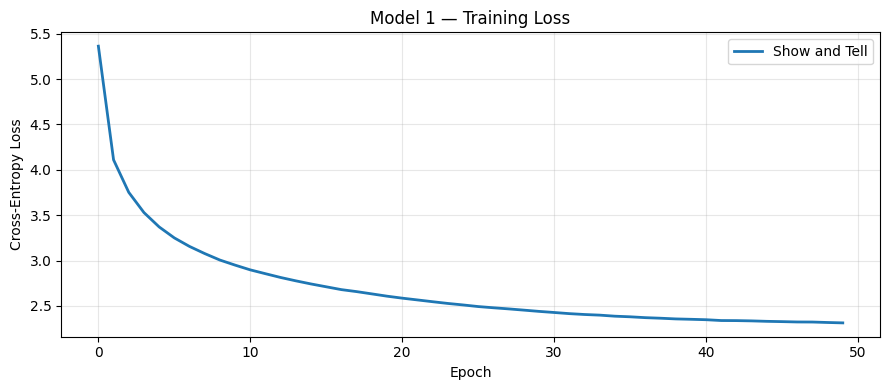

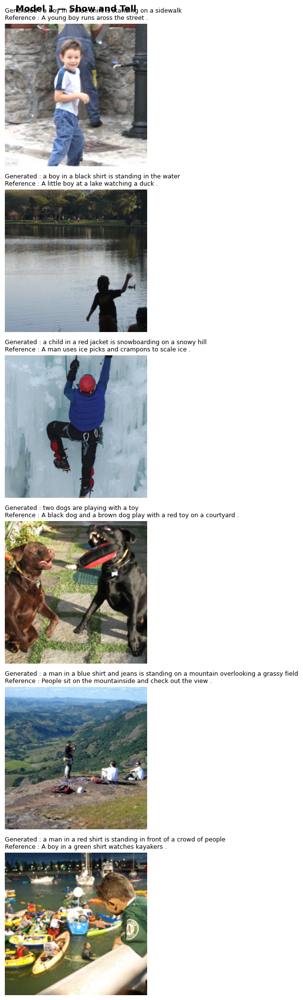

  Perplexity : 15.28
  BLEU-1       : 0.5874
  BLEU-2       : 0.4052
  BLEU-3       : 0.2708
  BLEU-4       : 0.1794


In [13]:
# Training curve
plot_training_curves({"Show and Tell": sat_results["train_losses"]}, title="Model 1 — Training Loss")

# Sample captions
show_sample_captions(sat_encoder, sat_decoder, test_loader, tokenizer, DEVICE, n=6,
                     title="Model 1 — Show and Tell")

# Summary table
print("=" * 45)
print(f"  Perplexity : {sat_results['perplexity']:.2f}")
for k, v in sat_results["bleu"].items():
    print(f"  {k}       : {v:.4f}")
print("=" * 45)

Briefly summarize what happened during training, which captions looked convincing or weak, and what the BLEU score does or does not capture for this model.


<span style="color: red;"><strong>TODO:</strong> Write your reflection on Model 1 here.</span>


## Model 2 - Show, Attend and Tell

Now implement the continuation of the Show and Tell paper. An attention-based captioning model described in the paper [_Show, Attend and Tell_](https://arxiv.org/abs/1502.03044). Use the same test data subset and BLEU setup as before, then compare how attention changes the training behavior and generated captions.

**Architecture:**
- ResNet-18 spatial encoder: retains the 7×7 convolutional feature map → (B, 49, 512)
- Additive (Bahdanau) attention: at each decoding step the LSTM attends over the 49 spatial locations
- LSTMCell decoder with context vector concatenated to the word embedding
- Doubly-stochastic attention gate to encourage each feature location to be attended to


In [14]:
# Hyperparameters for Show, Attend and Tell
SATT_ENCODER_DIM  = 512   # channels in the ResNet-18 spatial feature map
SATT_EMBED_DIM    = 256
SATT_DECODER_DIM  = 512
SATT_ATTENTION_DIM = 256
SATT_DROPOUT       = 0.25
SATT_FREEZE_ENC    = True
SATT_LR            = 5e-4
SATT_N_EPOCHS      = 50
SATT_WEIGHT_DECAY  = 1e-5

In [15]:
# ── Encoder (Show, Attend and Tell) ─────────────────────────────────────────
class ShowAttendTellEncoder(nn.Module):
    """
    ResNet-18 with the head removed; retains the 7x7 spatial feature map.
    Outputs (B, 49, 512) — 49 spatial locations, each a 512-d descriptor.
    """
    def __init__(self, freeze: bool = False):
        super().__init__()
        backbone = tvm.resnet18(weights=tvm.ResNet18_Weights.DEFAULT)
        # Layers up to (and including) layer4 — output: (B, 512, 7, 7)
        self.features = nn.Sequential(
            backbone.conv1, backbone.bn1, backbone.relu, backbone.maxpool,
            backbone.layer1, backbone.layer2, backbone.layer3, backbone.layer4,
        )
        if freeze:
            for p in self.features.parameters():
                p.requires_grad = False

    def forward(self, images: torch.Tensor) -> torch.Tensor:
        feat = self.features(images)              # (B, 512, 7, 7)
        B, C, H, W = feat.shape
        feat = feat.permute(0, 2, 3, 1)           # (B, 7, 7, 512)
        return feat.reshape(B, H * W, C)          # (B, 49, 512)


# ── Additive (Bahdanau) Attention ────────────────────────────────────────────
class AdditiveAttention(nn.Module):
    """
    Bahdanau / additive attention as used in Show, Attend and Tell.
    energy_t = v^T tanh(W_enc * encoder_out + W_dec * h_t)
    alpha_t  = softmax(energy_t)
    context  = sum_i alpha_{t,i} * encoder_out_i
    """
    def __init__(self, encoder_dim: int, decoder_dim: int, attention_dim: int):
        super().__init__()
        self.W_enc = nn.Linear(encoder_dim, attention_dim)
        self.W_dec = nn.Linear(decoder_dim, attention_dim)
        self.v     = nn.Linear(attention_dim, 1, bias=False)

    def forward(self, encoder_out: torch.Tensor, h: torch.Tensor):
        # encoder_out : (B, num_pix, enc_dim)
        # h           : (B, dec_dim)
        enc_proj = self.W_enc(encoder_out)                   # (B, P, attn_dim)
        dec_proj = self.W_dec(h).unsqueeze(1)                # (B, 1, attn_dim)
        energy   = self.v(torch.tanh(enc_proj + dec_proj)).squeeze(-1)  # (B, P)
        alpha    = torch.softmax(energy, dim=-1)             # (B, P)
        context  = (encoder_out * alpha.unsqueeze(-1)).sum(1)# (B, enc_dim)
        return context, alpha


# ── Decoder (Show, Attend and Tell) ──────────────────────────────────────────
class ShowAttendTellDecoder(nn.Module):
    """
    LSTM decoder with Bahdanau attention and doubly-stochastic gate.
    forward()                — teacher-forced training
    generate()               — greedy inference
    generate_with_attention()— greedy inference returning attention weights
    """
    def __init__(self, vocab_size: int, encoder_dim: int, embed_dim: int,
                 decoder_dim: int, attention_dim: int,
                 dropout: float = 0.5, pad_idx: int = 0):
        super().__init__()
        self.pad_idx   = pad_idx
        self.attention = AdditiveAttention(encoder_dim, decoder_dim, attention_dim)
        self.embed     = nn.Embedding(vocab_size, embed_dim, padding_idx=pad_idx)
        self.init_h    = nn.Linear(encoder_dim, decoder_dim)
        self.init_c    = nn.Linear(encoder_dim, decoder_dim)
        self.lstm      = nn.LSTMCell(embed_dim + encoder_dim, decoder_dim)
        self.beta_gate = nn.Linear(decoder_dim, encoder_dim)   # doubly-stochastic
        self.drop      = nn.Dropout(dropout)
        self.fc        = nn.Linear(decoder_dim, vocab_size)

    def _init_hidden(self, enc_out: torch.Tensor):
        mean_enc = enc_out.mean(1)                   # (B, enc_dim)
        return torch.tanh(self.init_h(mean_enc)), torch.tanh(self.init_c(mean_enc))

    def forward(self, enc_out: torch.Tensor, captions: torch.Tensor) -> torch.Tensor:
        """enc_out: (B, P, enc_dim);  captions: (B, max_len)"""
        h, c  = self._init_hidden(enc_out)
        embeds = self.drop(self.embed(captions[:, :-1]))  # (B, T-1, E)
        logits = []
        for t in range(embeds.size(1)):
            ctx, alpha = self.attention(enc_out, h)
            gate = torch.sigmoid(self.beta_gate(h))
            ctx  = gate * ctx
            h, c = self.lstm(torch.cat([embeds[:, t], ctx], dim=-1), (h, c))
            logits.append(self.fc(self.drop(h)))
        return torch.stack(logits, dim=1)           # (B, T-1, V)

    @torch.no_grad()
    def generate(self, enc_out: torch.Tensor, tokenizer, max_len: int = 35) -> torch.Tensor:
        self.eval()
        B, device = enc_out.size(0), enc_out.device
        h, c = self._init_hidden(enc_out)
        tok  = torch.full((B,), tokenizer.bos_idx, dtype=torch.long, device=device)
        out  = []
        for _ in range(max_len):
            ctx, _ = self.attention(enc_out, h)
            gate   = torch.sigmoid(self.beta_gate(h))
            ctx    = gate * ctx
            h, c   = self.lstm(torch.cat([self.embed(tok), ctx], dim=-1), (h, c))
            pred   = self.fc(h).argmax(-1)
            out.append(pred)
            tok = pred
        return torch.stack(out, dim=1)              # (B, max_len)

    @torch.no_grad()
    def generate_with_attention(self, enc_out: torch.Tensor, tokenizer,
                                max_len: int = 35):
        """Returns (token_ids (B,T), attention_weights (B,T,P))."""
        self.eval()
        B, device = enc_out.size(0), enc_out.device
        h, c = self._init_hidden(enc_out)
        tok  = torch.full((B,), tokenizer.bos_idx, dtype=torch.long, device=device)
        ids_list, alpha_list = [], []
        for _ in range(max_len):
            ctx, alpha = self.attention(enc_out, h)
            gate = torch.sigmoid(self.beta_gate(h))
            ctx  = gate * ctx
            h, c = self.lstm(torch.cat([self.embed(tok), ctx], dim=-1), (h, c))
            pred = self.fc(h).argmax(-1)
            ids_list.append(pred)
            alpha_list.append(alpha)
            tok = pred
        return torch.stack(ids_list, dim=1), torch.stack(alpha_list, dim=1)


print("ShowAttendTellEncoder and ShowAttendTellDecoder defined.")

ShowAttendTellEncoder and ShowAttendTellDecoder defined.


In [16]:
# Instantiate Model 2
satt_encoder = ShowAttendTellEncoder(freeze=SATT_FREEZE_ENC).to(DEVICE)
satt_decoder = ShowAttendTellDecoder(
    vocab_size=len(tokenizer),
    encoder_dim=SATT_ENCODER_DIM,
    embed_dim=SATT_EMBED_DIM,
    decoder_dim=SATT_DECODER_DIM,
    attention_dim=SATT_ATTENTION_DIM,
    dropout=SATT_DROPOUT,
    pad_idx=PAD_IDX,
).to(DEVICE)

total_params = sum(p.numel() for p in list(satt_encoder.parameters()) + list(satt_decoder.parameters()))
print(f"Show, Attend and Tell total params: {total_params:,}")

# Train
satt_results = run_training(
    encoder=satt_encoder,
    decoder=satt_decoder,
    train_loader=train_loader,
    test_loader=test_loader,
    tokenizer=tokenizer,
    device=DEVICE,
    n_epochs=SATT_N_EPOCHS,
    lr=SATT_LR,
    weight_decay=SATT_WEIGHT_DECAY,
    captions_map=test_captions_map,
    model_name="ShowAttendTell",
)

Show, Attend and Tell total params: 16,890,009
 Training: ShowAttendTell
------------------------------------------------------------------------
 device          : cuda
 AMP             : True (torch.bfloat16)
 epochs          : 50
 lr / wd         : 5.00e-04 / 1.00e-05
 train batches   : 64   (batch_size=512)
 val batches     : 4
 encoder params  : 0 trainable
 decoder params  : 5,713,497 trainable
 eval_every      : 1    bleu_every: 0    sample_every: 0


[ShowAttendTell] Epoch 1/50:   0%|                                                                            …

[ShowAttendTell] Epoch 01/50 | train_loss=5.1515 acc=17.64% | gnorm μ=0.69 max=2.25 | lr=5.00e-04 | 72.2s | val_loss=4.4801 ppl=87.79 acc=23.52%  ← new best


[ShowAttendTell] Epoch 2/50:   0%|                                                                            …

[ShowAttendTell] Epoch 02/50 | train_loss=4.2254 acc=26.62% | gnorm μ=0.31 max=0.53 | lr=5.00e-04 | 73.1s | val_loss=3.9270 ppl=50.43 acc=29.84%  ← new best


[ShowAttendTell] Epoch 3/50:   0%|                                                                            …

[ShowAttendTell] Epoch 03/50 | train_loss=3.8134 acc=30.39% | gnorm μ=0.28 max=0.48 | lr=4.98e-04 | 74.6s | val_loss=3.6321 ppl=37.44 acc=31.97%  ← new best


[ShowAttendTell] Epoch 4/50:   0%|                                                                            …

[ShowAttendTell] Epoch 04/50 | train_loss=3.5736 acc=32.40% | gnorm μ=0.28 max=0.52 | lr=4.96e-04 | 87.7s | val_loss=3.4303 ppl=30.64 acc=34.06%  ← new best


[ShowAttendTell] Epoch 5/50:   0%|                                                                            …

[ShowAttendTell] Epoch 05/50 | train_loss=3.4102 acc=33.73% | gnorm μ=0.27 max=0.53 | lr=4.93e-04 | 89.8s | val_loss=3.2808 ppl=27.06 acc=34.94%  ← new best


[ShowAttendTell] Epoch 6/50:   0%|                                                                            …

[ShowAttendTell] Epoch 06/50 | train_loss=3.2887 acc=34.79% | gnorm μ=0.28 max=0.56 | lr=4.89e-04 | 97.1s | val_loss=3.1998 ppl=24.82 acc=35.45%  ← new best


[ShowAttendTell] Epoch 7/50:   0%|                                                                            …

[ShowAttendTell] Epoch 07/50 | train_loss=3.1928 acc=35.67% | gnorm μ=0.29 max=0.57 | lr=4.84e-04 | 87.9s | val_loss=3.1148 ppl=23.11 acc=36.48%  ← new best


[ShowAttendTell] Epoch 8/50:   0%|                                                                            …

[ShowAttendTell] Epoch 08/50 | train_loss=3.1161 acc=36.27% | gnorm μ=0.30 max=0.55 | lr=4.79e-04 | 87.2s | val_loss=3.0938 ppl=21.66 acc=37.00%  ← new best


[ShowAttendTell] Epoch 9/50:   0%|                                                                            …

[ShowAttendTell] Epoch 09/50 | train_loss=3.0497 acc=36.84% | gnorm μ=0.30 max=0.60 | lr=4.72e-04 | 81.8s | val_loss=3.0526 ppl=21.10 acc=37.45%  ← new best


[ShowAttendTell] Epoch 10/50:   0%|                                                                           …

[ShowAttendTell] Epoch 10/50 | train_loss=2.9934 acc=37.46% | gnorm μ=0.31 max=0.60 | lr=4.65e-04 | 73.1s | val_loss=3.0532 ppl=21.06 acc=37.22%


[ShowAttendTell] Epoch 11/50:   0%|                                                                           …

[ShowAttendTell] Epoch 11/50 | train_loss=2.9445 acc=37.92% | gnorm μ=0.32 max=0.59 | lr=4.57e-04 | 72.2s | val_loss=2.9467 ppl=19.13 acc=37.84%  ← new best


[ShowAttendTell] Epoch 12/50:   0%|                                                                           …

[ShowAttendTell] Epoch 12/50 | train_loss=2.9005 acc=38.43% | gnorm μ=0.31 max=0.61 | lr=4.48e-04 | 70.4s | val_loss=2.9893 ppl=19.60 acc=37.44%


[ShowAttendTell] Epoch 13/50:   0%|                                                                           …

[ShowAttendTell] Epoch 13/50 | train_loss=2.8586 acc=38.70% | gnorm μ=0.32 max=0.58 | lr=4.39e-04 | 70.5s | val_loss=2.9036 ppl=18.21 acc=38.74%  ← new best


[ShowAttendTell] Epoch 14/50:   0%|                                                                           …

[ShowAttendTell] Epoch 14/50 | train_loss=2.8239 acc=39.10% | gnorm μ=0.34 max=0.62 | lr=4.29e-04 | 73.1s | val_loss=2.9604 ppl=18.50 acc=38.56%


[ShowAttendTell] Epoch 15/50:   0%|                                                                           …

[ShowAttendTell] Epoch 15/50 | train_loss=2.7921 acc=39.44% | gnorm μ=0.33 max=0.62 | lr=4.18e-04 | 85.6s | val_loss=2.8793 ppl=17.67 acc=38.88%  ← new best


[ShowAttendTell] Epoch 16/50:   0%|                                                                           …

[ShowAttendTell] Epoch 16/50 | train_loss=2.7626 acc=39.74% | gnorm μ=0.33 max=0.61 | lr=4.07e-04 | 86.1s | val_loss=2.8537 ppl=17.15 acc=39.15%  ← new best


[ShowAttendTell] Epoch 17/50:   0%|                                                                           …

[ShowAttendTell] Epoch 17/50 | train_loss=2.7345 acc=40.01% | gnorm μ=0.32 max=0.67 | lr=3.96e-04 | 86.5s | val_loss=2.8431 ppl=17.10 acc=39.51%  ← new best


[ShowAttendTell] Epoch 18/50:   0%|                                                                           …

[ShowAttendTell] Epoch 18/50 | train_loss=2.7063 acc=40.29% | gnorm μ=0.33 max=0.65 | lr=3.83e-04 | 83.9s | val_loss=2.8380 ppl=16.91 acc=39.35%  ← new best


[ShowAttendTell] Epoch 19/50:   0%|                                                                           …

[ShowAttendTell] Epoch 19/50 | train_loss=2.6837 acc=40.63% | gnorm μ=0.33 max=0.59 | lr=3.71e-04 | 83.9s | val_loss=2.8341 ppl=17.05 acc=39.63%  ← new best


[ShowAttendTell] Epoch 20/50:   0%|                                                                           …

[ShowAttendTell] Epoch 20/50 | train_loss=2.6613 acc=40.78% | gnorm μ=0.34 max=0.66 | lr=3.58e-04 | 87.7s | val_loss=2.7745 ppl=16.14 acc=40.09%  ← new best


[ShowAttendTell] Epoch 21/50:   0%|                                                                           …

[ShowAttendTell] Epoch 21/50 | train_loss=2.6418 acc=41.11% | gnorm μ=0.35 max=0.70 | lr=3.45e-04 | 84.0s | val_loss=2.8069 ppl=16.30 acc=39.96%


[ShowAttendTell] Epoch 22/50:   0%|                                                                           …

[ShowAttendTell] Epoch 22/50 | train_loss=2.6220 acc=41.31% | gnorm μ=0.35 max=0.71 | lr=3.31e-04 | 88.7s | val_loss=2.8236 ppl=16.61 acc=39.71%


[ShowAttendTell] Epoch 23/50:   0%|                                                                           …

[ShowAttendTell] Epoch 23/50 | train_loss=2.6024 acc=41.57% | gnorm μ=0.34 max=0.71 | lr=3.17e-04 | 82.5s | val_loss=2.8101 ppl=16.53 acc=39.70%


[ShowAttendTell] Epoch 24/50:   0%|                                                                           …

[ShowAttendTell] Epoch 24/50 | train_loss=2.5882 acc=41.69% | gnorm μ=0.35 max=0.70 | lr=3.03e-04 | 82.2s | val_loss=2.7905 ppl=16.32 acc=40.03%


[ShowAttendTell] Epoch 25/50:   0%|                                                                           …

[ShowAttendTell] Epoch 25/50 | train_loss=2.5719 acc=41.93% | gnorm μ=0.35 max=0.76 | lr=2.89e-04 | 78.0s | val_loss=2.7643 ppl=15.92 acc=40.12%  ← new best


[ShowAttendTell] Epoch 26/50:   0%|                                                                           …

[ShowAttendTell] Epoch 26/50 | train_loss=2.5564 acc=42.00% | gnorm μ=0.36 max=0.73 | lr=2.75e-04 | 68.4s | val_loss=2.7974 ppl=16.36 acc=39.86%


[ShowAttendTell] Epoch 27/50:   0%|                                                                           …

[ShowAttendTell] Epoch 27/50 | train_loss=2.5414 acc=42.25% | gnorm μ=0.35 max=0.72 | lr=2.61e-04 | 68.5s | val_loss=2.7952 ppl=16.30 acc=39.73%


[ShowAttendTell] Epoch 28/50:   0%|                                                                           …

[ShowAttendTell] Epoch 28/50 | train_loss=2.5285 acc=42.44% | gnorm μ=0.35 max=0.68 | lr=2.47e-04 | 71.7s | val_loss=2.7564 ppl=15.79 acc=40.79%  ← new best


[ShowAttendTell] Epoch 29/50:   0%|                                                                           …

[ShowAttendTell] Epoch 29/50 | train_loss=2.5164 acc=42.61% | gnorm μ=0.35 max=0.72 | lr=2.33e-04 | 73.9s | val_loss=2.7741 ppl=15.73 acc=40.75%


[ShowAttendTell] Epoch 30/50:   0%|                                                                           …

[ShowAttendTell] Epoch 30/50 | train_loss=2.5043 acc=42.76% | gnorm μ=0.35 max=0.71 | lr=2.19e-04 | 74.8s | val_loss=2.7410 ppl=15.65 acc=40.32%  ← new best


[ShowAttendTell] Epoch 31/50:   0%|                                                                           …

[ShowAttendTell] Epoch 31/50 | train_loss=2.4903 acc=43.00% | gnorm μ=0.35 max=0.70 | lr=2.05e-04 | 73.7s | val_loss=2.7821 ppl=15.79 acc=40.48%


[ShowAttendTell] Epoch 32/50:   0%|                                                                           …

[ShowAttendTell] Epoch 32/50 | train_loss=2.4834 acc=43.09% | gnorm μ=0.36 max=0.73 | lr=1.92e-04 | 73.6s | val_loss=2.7605 ppl=15.77 acc=40.51%


[ShowAttendTell] Epoch 33/50:   0%|                                                                           …

[ShowAttendTell] Epoch 33/50 | train_loss=2.4723 acc=43.23% | gnorm μ=0.35 max=0.67 | lr=1.79e-04 | 74.7s | val_loss=2.8115 ppl=16.10 acc=40.06%


[ShowAttendTell] Epoch 34/50:   0%|                                                                           …

[ShowAttendTell] Epoch 34/50 | train_loss=2.4629 acc=43.28% | gnorm μ=0.37 max=0.73 | lr=1.67e-04 | 71.0s | val_loss=2.7611 ppl=16.08 acc=40.35%


[ShowAttendTell] Epoch 35/50:   0%|                                                                           …

[ShowAttendTell] Epoch 35/50 | train_loss=2.4559 acc=43.43% | gnorm μ=0.36 max=0.71 | lr=1.54e-04 | 71.6s | val_loss=2.7872 ppl=16.08 acc=40.08%


[ShowAttendTell] Epoch 36/50:   0%|                                                                           …

[ShowAttendTell] Epoch 36/50 | train_loss=2.4498 acc=43.48% | gnorm μ=0.36 max=0.74 | lr=1.43e-04 | 73.3s | val_loss=2.7621 ppl=15.54 acc=40.81%


[ShowAttendTell] Epoch 37/50:   0%|                                                                           …

[ShowAttendTell] Epoch 37/50 | train_loss=2.4401 acc=43.60% | gnorm μ=0.36 max=0.74 | lr=1.32e-04 | 78.1s | val_loss=2.7316 ppl=15.47 acc=40.59%  ← new best


[ShowAttendTell] Epoch 38/50:   0%|                                                                           …

[ShowAttendTell] Epoch 38/50 | train_loss=2.4341 acc=43.78% | gnorm μ=0.36 max=0.69 | lr=1.21e-04 | 72.4s | val_loss=2.7610 ppl=16.07 acc=40.12%


[ShowAttendTell] Epoch 39/50:   0%|                                                                           …

[ShowAttendTell] Epoch 39/50 | train_loss=2.4296 acc=43.76% | gnorm μ=0.36 max=0.71 | lr=1.11e-04 | 75.3s | val_loss=2.7100 ppl=15.38 acc=40.99%  ← new best


[ShowAttendTell] Epoch 40/50:   0%|                                                                           …

[ShowAttendTell] Epoch 40/50 | train_loss=2.4234 acc=43.91% | gnorm μ=0.36 max=0.72 | lr=1.02e-04 | 69.6s | val_loss=2.7661 ppl=15.49 acc=40.68%


[ShowAttendTell] Epoch 41/50:   0%|                                                                           …

[ShowAttendTell] Epoch 41/50 | train_loss=2.4191 acc=43.94% | gnorm μ=0.36 max=0.75 | lr=9.30e-05 | 70.2s | val_loss=2.7249 ppl=15.30 acc=40.62%


[ShowAttendTell] Epoch 42/50:   0%|                                                                           …

[ShowAttendTell] Epoch 42/50 | train_loss=2.4140 acc=44.01% | gnorm μ=0.36 max=0.70 | lr=8.50e-05 | 69.5s | val_loss=2.7585 ppl=15.94 acc=40.37%


[ShowAttendTell] Epoch 43/50:   0%|                                                                           …

[ShowAttendTell] Epoch 43/50 | train_loss=2.4116 acc=44.06% | gnorm μ=0.36 max=0.71 | lr=7.78e-05 | 70.9s | val_loss=2.7373 ppl=15.37 acc=40.80%


[ShowAttendTell] Epoch 44/50:   0%|                                                                           …

[ShowAttendTell] Epoch 44/50 | train_loss=2.4052 acc=44.09% | gnorm μ=0.36 max=0.75 | lr=7.14e-05 | 89.3s | val_loss=2.7369 ppl=15.39 acc=40.45%


[ShowAttendTell] Epoch 45/50:   0%|                                                                           …

[ShowAttendTell] Epoch 45/50 | train_loss=2.4031 acc=44.21% | gnorm μ=0.36 max=0.76 | lr=6.58e-05 | 84.0s | val_loss=2.7105 ppl=15.03 acc=40.95%


[ShowAttendTell] Epoch 46/50:   0%|                                                                           …

[ShowAttendTell] Epoch 46/50 | train_loss=2.4002 acc=44.24% | gnorm μ=0.36 max=0.71 | lr=6.10e-05 | 85.8s | val_loss=2.7578 ppl=15.59 acc=40.47%


[ShowAttendTell] Epoch 47/50:   0%|                                                                           …

[ShowAttendTell] Epoch 47/50 | train_loss=2.3970 acc=44.29% | gnorm μ=0.36 max=0.73 | lr=5.71e-05 | 79.2s | val_loss=2.7274 ppl=15.47 acc=40.56%


[ShowAttendTell] Epoch 48/50:   0%|                                                                           …

[ShowAttendTell] Epoch 48/50 | train_loss=2.3959 acc=44.32% | gnorm μ=0.36 max=0.75 | lr=5.40e-05 | 73.2s | val_loss=2.7643 ppl=15.51 acc=40.91%


[ShowAttendTell] Epoch 49/50:   0%|                                                                           …

[ShowAttendTell] Epoch 49/50 | train_loss=2.3904 acc=44.31% | gnorm μ=0.36 max=0.73 | lr=5.18e-05 | 72.4s | val_loss=2.7249 ppl=15.14 acc=40.83%


[ShowAttendTell] Epoch 50/50:   0%|                                                                           …

[ShowAttendTell] Epoch 50/50 | train_loss=2.3895 acc=44.43% | gnorm μ=0.36 max=0.76 | lr=5.04e-05 | 74.1s | val_loss=2.7637 ppl=15.84 acc=40.54%
------------------------------------------------------------------------
 Training finished in 68.5 min (82.2s/epoch on average)


BLEU:   0%|                                                                                                   …


[ShowAttendTell] Final Perplexity: 15.09
   BLEU-1: 0.5900
   BLEU-2: 0.4136
   BLEU-3: 0.2789
   BLEU-4: 0.1872


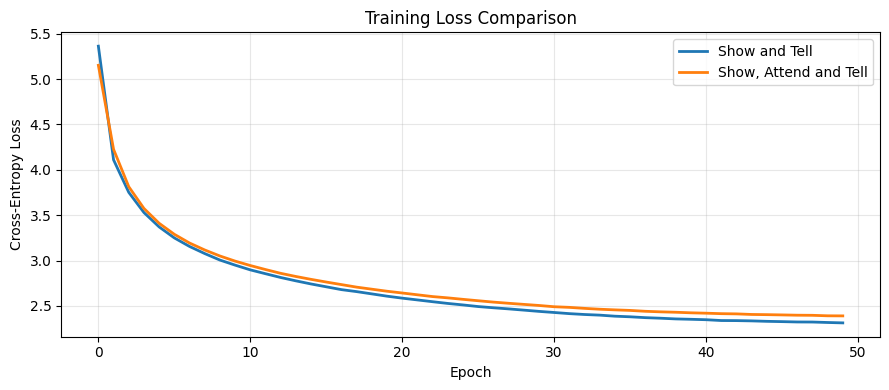

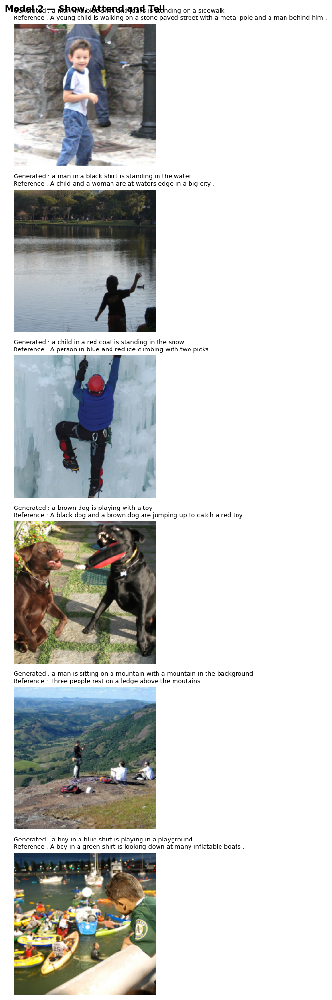


Metric                    Model 1      Model 2
----------------------------------------------
Perplexity                  15.28        15.09
BLEU-1                     0.5874       0.5900
BLEU-2                     0.4052       0.4136
BLEU-3                     0.2708       0.2789
BLEU-4                     0.1794       0.1872


In [17]:
# Training curves — both models together
plot_training_curves(
    {"Show and Tell": sat_results["train_losses"],
     "Show, Attend and Tell": satt_results["train_losses"]},
    title="Training Loss Comparison"
)

# Sample captions
show_sample_captions(satt_encoder, satt_decoder, test_loader, tokenizer, DEVICE, n=6,
                     title="Model 2 — Show, Attend and Tell")

# Metric comparison table
print("\n{:<22} {:>10} {:>12}".format("Metric", "Model 1", "Model 2"))
print("-" * 46)
print("{:<22} {:>10.2f} {:>12.2f}".format(
    "Perplexity", sat_results["perplexity"], satt_results["perplexity"]))
for k in ["BLEU-1", "BLEU-2", "BLEU-3", "BLEU-4"]:
    print("{:<22} {:>10.4f} {:>12.4f}".format(k, sat_results["bleu"][k], satt_results["bleu"][k]))

Briefly summarize how this model behaved during training, where attention seemed to help or fail, and how the BLEU score compares to Model 1.


<span style="color: red;"><strong>TODO:</strong> Write your reflection on Model 2 here.</span>


## Additional Task 1: Attention Visualization (Easy)

**Hypothesis:** If the attention mechanism is working correctly, the model should focus on semantically relevant image regions when generating each word (e.g. attend to a dog region when outputting the word *dog*).

**Experiment:** For a handful of test images we run `generate_with_attention()`, decode the caption word-by-word, and overlay the corresponding 7×7 attention map (bilinearly upsampled to 224×224) on top of the original image.

**Expected outcome:** Meaningful attention maps should show high activations near the objects or scene elements described by each token.


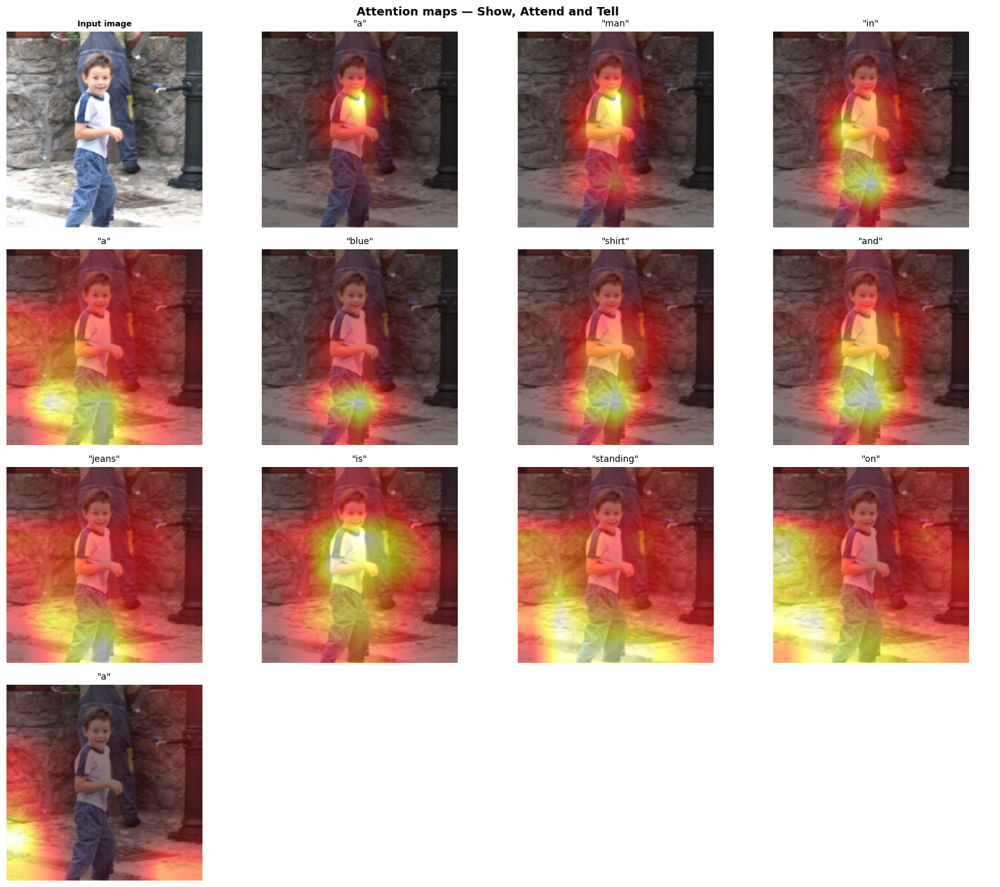

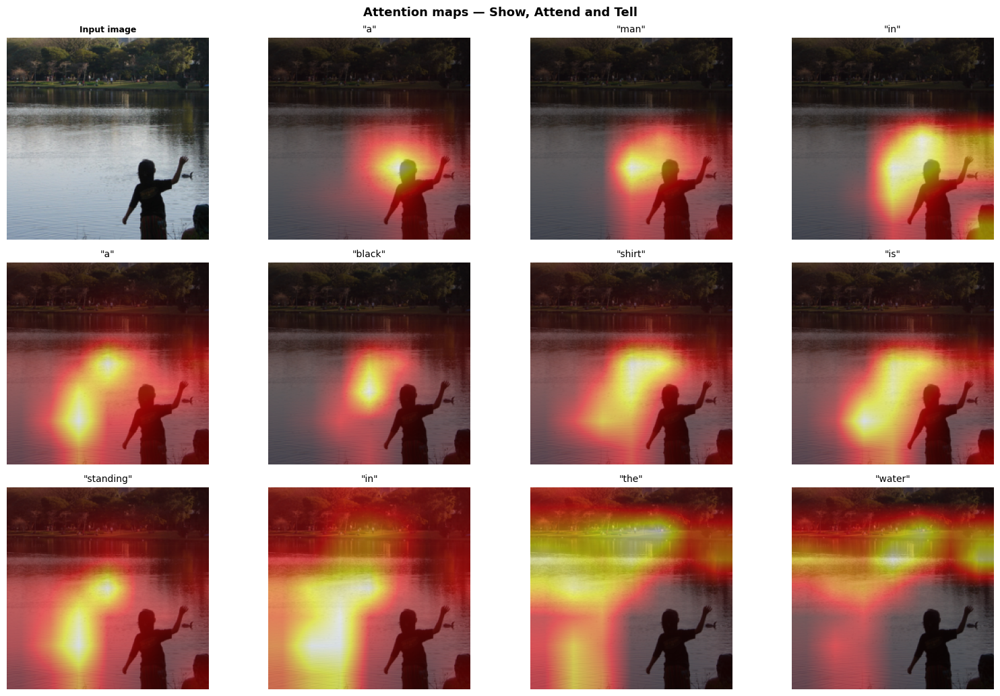

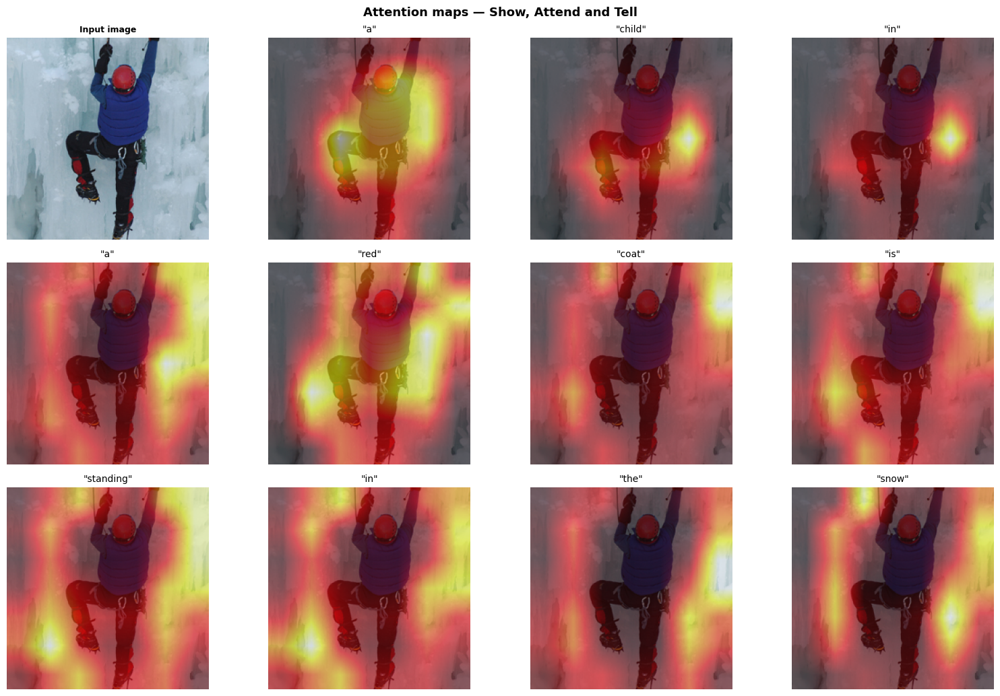

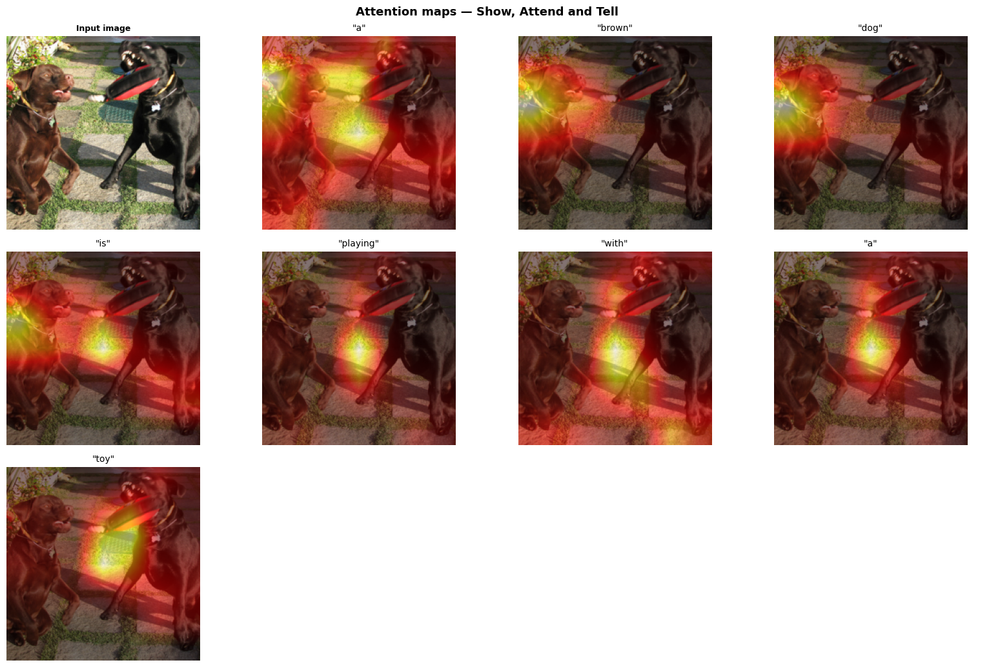

In [18]:
def visualize_attention_for_image(image_tensor: torch.Tensor,
                                   token_ids: torch.Tensor,
                                   attention_weights: torch.Tensor,
                                   tokenizer,
                                   max_words: int = 12):
    """
    Overlay attention heatmaps on the image for each generated word.
    image_tensor      : (3, H, W) — normalised tensor
    token_ids         : (max_len,) — generated ids (no BOS)
    attention_weights : (max_len, num_pixels) — e.g. (35, 49)

    Note: token_ids[t] and attention_weights[t] correspond to the SAME
    decoding step, so we must track the original index when filtering out
    special tokens like <unk>/<bos>/<pad>.
    """
    img_np = denormalize_image(image_tensor.cpu()).permute(1, 2, 0).numpy()
    grid   = int(math.sqrt(attention_weights.shape[-1]))   # 7 for a 7×7 map

    # Decode word by word, KEEPING the original time index for each kept word
    words = []  # list of (word, original_index)
    for orig_idx, tid in enumerate(token_ids.cpu().tolist()):
        word = tokenizer.itos.get(tid, "<unk>")
        if word == "<eos>":
            break
        if word not in ("<bos>", "<pad>", "<unk>"):
            words.append((word, orig_idx))
    words = words[:max_words]

    if not words:
        print("(no decodable words to visualize for this image)")
        return

    cols = 4
    rows = math.ceil((len(words) + 1) / cols)   # +1 for the original image panel
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 3.5 * rows),
                             squeeze=False)
    axes = axes.flatten()

    # First panel: original image
    axes[0].imshow(img_np)
    axes[0].set_title("Input image", fontsize=9, weight="bold")
    axes[0].axis("off")

    for panel_idx, (word, orig_idx) in enumerate(words, start=1):
        alpha     = attention_weights[orig_idx].cpu()          # (num_pixels,)
        alpha_map = alpha.reshape(grid, grid).numpy()
        # Normalize for display so the heatmap uses the full dynamic range
        if alpha_map.max() > 0:
            alpha_map = alpha_map / alpha_map.max()
        alpha_up = np.array(
            Image.fromarray((alpha_map * 255).astype(np.uint8)).resize(
                (img_np.shape[1], img_np.shape[0]), resample=Image.BILINEAR
            )
        ) / 255.0
        axes[panel_idx].imshow(img_np)
        axes[panel_idx].imshow(alpha_up, alpha=0.55, cmap="hot", vmin=0)
        axes[panel_idx].set_title(f'"{word}"', fontsize=10)
        axes[panel_idx].axis("off")

    for j in range(len(words) + 1, len(axes)):
        axes[j].axis("off")

    plt.suptitle("Attention maps — Show, Attend and Tell", fontsize=13, weight="bold")
    plt.tight_layout()
    plt.show()


# ── Run visualisation on a few test images ───────────────────────────────────
satt_encoder.eval(); satt_decoder.eval()
vis_images, _, _, _, _ = next(iter(test_loader))
vis_images_dev = vis_images[:4].to(DEVICE)

with torch.no_grad():
    if USE_AMP:
        with torch.autocast(device_type=DEVICE.type, dtype=AMP_DTYPE):
            enc_out = satt_encoder(vis_images_dev)              # (4, 49, 512)
            tok_ids, attn_weights = satt_decoder.generate_with_attention(enc_out, tokenizer)
    else:
        enc_out = satt_encoder(vis_images_dev)
        tok_ids, attn_weights = satt_decoder.generate_with_attention(enc_out, tokenizer)

# Cast to fp32 for matplotlib / numpy ops
attn_weights = attn_weights.float()

for i in range(vis_images_dev.size(0)):
    visualize_attention_for_image(
        image_tensor=vis_images[i],
        token_ids=tok_ids[i],
        attention_weights=attn_weights[i],
        tokenizer=tokenizer,
    )


**Observation (fill in after running):**  
*Describe which words had the most focused attention, whether the model attended to correct regions, and any failure modes you observed.*


## Additional Task 2: Beam Search (Easy)

**Hypothesis:** Beam search should produce more globally coherent captions than greedy decoding because it maintains multiple candidate sequences at each step and therefore avoids locally optimal but globally suboptimal token selections.

**Experiment:** Implement beam search for the Show, Attend and Tell model and compare BLEU scores against greedy decoding on the same test set.


In [19]:
@torch.no_grad()
def beam_search_single(encoder_out: torch.Tensor, decoder: ShowAttendTellDecoder,
                        tokenizer, beam_size: int = 5, max_len: int = 35) -> list:
    """
    Beam search for a single image.
    encoder_out : (1, num_pixels, encoder_dim)
    Returns list of token ids (best hypothesis, without BOS).
    """
    device = encoder_out.device
    h, c   = decoder._init_hidden(encoder_out)           # (1, dec_dim)

    # Beams: list of (score, token_list, h, c)
    beams     = [(0.0, [tokenizer.bos_idx], h, c)]
    completed = []

    for step in range(max_len):
        all_cands = []
        for score, toks, h_b, c_b in beams:
            tok   = torch.tensor([toks[-1]], dtype=torch.long, device=device)
            emb   = decoder.embed(tok)                   # (1, E)
            ctx, alpha = decoder.attention(encoder_out, h_b)
            gate  = torch.sigmoid(decoder.beta_gate(h_b))
            ctx   = gate * ctx
            h_new, c_new = decoder.lstm(torch.cat([emb, ctx], dim=-1), (h_b, c_b))
            log_probs    = F.log_softmax(decoder.fc(h_new), dim=-1)[0]  # (V,)
            topk_lp, topk_ids = log_probs.topk(beam_size)
            for lp, tid in zip(topk_lp.tolist(), topk_ids.tolist()):
                all_cands.append((score + lp, toks + [tid], h_new, c_new))

        # Sort by score
        all_cands.sort(key=lambda x: x[0], reverse=True)

        beams = []
        for score, toks, h_b, c_b in all_cands:
            if toks[-1] == tokenizer.eos_idx:
                # Normalise by length
                completed.append((score / len(toks), toks[1:]))  # strip BOS
            else:
                beams.append((score, toks, h_b, c_b))
            if len(beams) == beam_size:
                break
        if not beams:
            break

    # Add remaining beams
    for score, toks, h_b, c_b in beams:
        completed.append((score / max(len(toks), 1), toks[1:]))

    completed.sort(key=lambda x: x[0], reverse=True)
    return completed[0][1] if completed else [tokenizer.eos_idx]


@torch.no_grad()
def compute_bleu_beam(encoder, decoder, dataloader, tokenizer, device,
                      captions_map: dict, beam_size: int = 5,
                      max_samples: int = 500) -> dict:
    """BLEU computed using beam-search decoded captions."""
    encoder.eval(); decoder.eval()
    references, hypotheses = [], []
    count = 0
    for images, _, _, image_ids, raw_caps in dataloader:
        if count >= max_samples:
            break
        for i, img in enumerate(images):
            img_dev = img.unsqueeze(0).to(device)
            enc_out = encoder(img_dev)            # (1, P, C)
            best    = beam_search_single(enc_out, decoder, tokenizer,
                                         beam_size=beam_size)
            all_caps = captions_map.get(image_ids[i], [raw_caps[i]])
            references.append([tokenize(c) for c in all_caps])
            hyp_str = tokenizer.decode(best, skip_special_tokens=True, stop_at_eos=True)
            hypotheses.append(tokenize(hyp_str))
            count += 1
            if count >= max_samples:
                break

    sf = SmoothingFunction().method1
    return {
        "BLEU-1": corpus_bleu(references, hypotheses, weights=(1,0,0,0), smoothing_function=sf),
        "BLEU-2": corpus_bleu(references, hypotheses, weights=(.5,.5,0,0), smoothing_function=sf),
        "BLEU-3": corpus_bleu(references, hypotheses, weights=(1/3,1/3,1/3,0), smoothing_function=sf),
        "BLEU-4": corpus_bleu(references, hypotheses, weights=(.25,.25,.25,.25), smoothing_function=sf),
    }


# Evaluate — greedy vs beam (subset for speed)
print("Evaluating Beam Search (beam_size=5) on 500 test samples …")
beam_bleu = compute_bleu_beam(satt_encoder, satt_decoder, test_loader,
                               tokenizer, DEVICE, test_captions_map,
                               beam_size=5, max_samples=500)

greedy_bleu_subset = compute_bleu(satt_encoder, satt_decoder, test_loader,
                                   tokenizer, DEVICE, test_captions_map,
                                   max_samples=500)

print("\n{:<22} {:>12} {:>12}".format("Metric", "Greedy", "Beam (k=5)"))
print("-" * 48)
for k in ["BLEU-1", "BLEU-2", "BLEU-3", "BLEU-4"]:
    print("{:<22} {:>12.4f} {:>12.4f}".format(k, greedy_bleu_subset[k], beam_bleu[k]))

Evaluating Beam Search (beam_size=5) on 500 test samples …


BLEU:   0%|                                                                                                   …


Metric                       Greedy   Beam (k=5)
------------------------------------------------
BLEU-1                       0.5859       0.5825
BLEU-2                       0.4138       0.4114
BLEU-3                       0.2792       0.2872
BLEU-4                       0.1849       0.1977


**Observation (fill in after running):**  
*Compare BLEU scores, inspect a few beam-search captions vs greedy, and discuss whether the improvement is consistent.*


## Additional Task 3: Alternative Attention Mechanisms (Moderate)

**Hypothesis:** Scaled dot-product attention (as used in transformer architectures) may converge faster or to a better optimum than additive Bahdanau attention because the multiplicative interaction captures alignment more sharply.

**Experiment:** Replace `AdditiveAttention` with `ScaledDotProductAttention` inside a copy of the Show, Attend and Tell decoder and train it under identical conditions. Compare BLEU and training curves.


In [20]:
# ── Scaled Dot-Product Attention ────────────────────────────────────────────
class ScaledDotProductAttention(nn.Module):
    """
    Dot-product attention: score = (W_dec * h) · (W_enc * e_i) / sqrt(d)
    where d is the attention dimension.
    """
    def __init__(self, encoder_dim: int, decoder_dim: int, attention_dim: int):
        super().__init__()
        self.W_enc  = nn.Linear(encoder_dim, attention_dim, bias=False)
        self.W_dec  = nn.Linear(decoder_dim, attention_dim, bias=False)
        self.scale  = math.sqrt(attention_dim)

    def forward(self, encoder_out: torch.Tensor, h: torch.Tensor):
        enc_proj = self.W_enc(encoder_out)                        # (B, P, d)
        dec_proj = self.W_dec(h).unsqueeze(2)                     # (B, d, 1)
        energy   = torch.bmm(enc_proj, dec_proj).squeeze(-1) / self.scale  # (B, P)
        alpha    = torch.softmax(energy, dim=-1)
        context  = (encoder_out * alpha.unsqueeze(-1)).sum(1)
        return context, alpha


# ── Decoder variant using dot-product attention ──────────────────────────────
class DotProductAttendTellDecoder(ShowAttendTellDecoder):
    """
    Identical to ShowAttendTellDecoder but uses ScaledDotProductAttention.
    Inherits forward / generate / generate_with_attention unchanged.
    """
    def __init__(self, vocab_size, encoder_dim, embed_dim, decoder_dim,
                 attention_dim, dropout=0.5, pad_idx=0):
        super().__init__(vocab_size, encoder_dim, embed_dim, decoder_dim,
                         attention_dim, dropout, pad_idx)
        # Override the attention module
        self.attention = ScaledDotProductAttention(encoder_dim, decoder_dim, attention_dim)


# ── Train the dot-product variant ────────────────────────────────────────────
dp_encoder = ShowAttendTellEncoder(freeze=SATT_FREEZE_ENC).to(DEVICE)
dp_decoder = DotProductAttendTellDecoder(
    vocab_size=len(tokenizer),
    encoder_dim=SATT_ENCODER_DIM,
    embed_dim=SATT_EMBED_DIM,
    decoder_dim=SATT_DECODER_DIM,
    attention_dim=SATT_ATTENTION_DIM,
    dropout=SATT_DROPOUT,
    pad_idx=PAD_IDX,
).to(DEVICE)

dp_results = run_training(
    encoder=dp_encoder,
    decoder=dp_decoder,
    train_loader=train_loader,
    test_loader=test_loader,
    tokenizer=tokenizer,
    device=DEVICE,
    n_epochs=SATT_N_EPOCHS,
    lr=SATT_LR,
    weight_decay=SATT_WEIGHT_DECAY,
    captions_map=test_captions_map,
    model_name="DotProductAttention",
)

 Training: DotProductAttention
------------------------------------------------------------------------
 device          : cuda
 AMP             : True (torch.bfloat16)
 epochs          : 50
 lr / wd         : 5.00e-04 / 1.00e-05
 train batches   : 64   (batch_size=512)
 val batches     : 4
 encoder params  : 0 trainable
 decoder params  : 5,712,729 trainable
 eval_every      : 1    bleu_every: 0    sample_every: 0


[DotProductAttention] Epoch 1/50:   0%|                                                                       …

[DotProductAttention] Epoch 01/50 | train_loss=5.1923 acc=17.17% | gnorm μ=0.72 max=2.26 | lr=5.00e-04 | 70.4s | val_loss=4.5459 ppl=94.11 acc=22.58%  ← new best


[DotProductAttention] Epoch 2/50:   0%|                                                                       …

[DotProductAttention] Epoch 02/50 | train_loss=4.2806 acc=25.97% | gnorm μ=0.29 max=0.50 | lr=5.00e-04 | 70.8s | val_loss=3.9364 ppl=51.46 acc=29.63%  ← new best


[DotProductAttention] Epoch 3/50:   0%|                                                                       …

[DotProductAttention] Epoch 03/50 | train_loss=3.8478 acc=29.99% | gnorm μ=0.27 max=0.50 | lr=4.98e-04 | 72.3s | val_loss=3.6320 ppl=37.90 acc=32.30%  ← new best


[DotProductAttention] Epoch 4/50:   0%|                                                                       …

[DotProductAttention] Epoch 04/50 | train_loss=3.5925 acc=32.16% | gnorm μ=0.28 max=0.53 | lr=4.96e-04 | 74.5s | val_loss=3.4749 ppl=31.91 acc=33.26%  ← new best


[DotProductAttention] Epoch 5/50:   0%|                                                                       …

[DotProductAttention] Epoch 05/50 | train_loss=3.4215 acc=33.66% | gnorm μ=0.28 max=0.53 | lr=4.93e-04 | 84.7s | val_loss=3.3199 ppl=27.80 acc=35.22%  ← new best


[DotProductAttention] Epoch 6/50:   0%|                                                                       …

[DotProductAttention] Epoch 06/50 | train_loss=3.2937 acc=34.75% | gnorm μ=0.29 max=0.51 | lr=4.89e-04 | 96.2s | val_loss=3.2393 ppl=25.14 acc=35.57%  ← new best


[DotProductAttention] Epoch 7/50:   0%|                                                                       …

[DotProductAttention] Epoch 07/50 | train_loss=3.1945 acc=35.63% | gnorm μ=0.29 max=0.52 | lr=4.84e-04 | 84.8s | val_loss=3.1612 ppl=23.11 acc=36.26%  ← new best


[DotProductAttention] Epoch 8/50:   0%|                                                                       …

[DotProductAttention] Epoch 08/50 | train_loss=3.1210 acc=36.20% | gnorm μ=0.31 max=0.59 | lr=4.79e-04 | 84.3s | val_loss=3.1098 ppl=22.41 acc=36.64%  ← new best


[DotProductAttention] Epoch 9/50:   0%|                                                                       …

[DotProductAttention] Epoch 09/50 | train_loss=3.0513 acc=36.92% | gnorm μ=0.30 max=0.58 | lr=4.72e-04 | 79.5s | val_loss=2.9874 ppl=20.42 acc=37.37%  ← new best


[DotProductAttention] Epoch 10/50:   0%|                                                                      …

[DotProductAttention] Epoch 10/50 | train_loss=2.9910 acc=37.41% | gnorm μ=0.31 max=0.55 | lr=4.65e-04 | 80.8s | val_loss=3.0378 ppl=20.49 acc=37.52%


[DotProductAttention] Epoch 11/50:   0%|                                                                      …

[DotProductAttention] Epoch 11/50 | train_loss=2.9400 acc=37.91% | gnorm μ=0.32 max=0.60 | lr=4.57e-04 | 83.6s | val_loss=2.9747 ppl=19.24 acc=38.41%  ← new best


[DotProductAttention] Epoch 12/50:   0%|                                                                      …

[DotProductAttention] Epoch 12/50 | train_loss=2.8961 acc=38.38% | gnorm μ=0.32 max=0.67 | lr=4.48e-04 | 77.1s | val_loss=2.9633 ppl=19.01 acc=38.44%  ← new best


[DotProductAttention] Epoch 13/50:   0%|                                                                      …

[DotProductAttention] Epoch 13/50 | train_loss=2.8547 acc=38.74% | gnorm μ=0.32 max=0.60 | lr=4.39e-04 | 73.0s | val_loss=2.9707 ppl=18.77 acc=38.19%


[DotProductAttention] Epoch 14/50:   0%|                                                                      …

[DotProductAttention] Epoch 14/50 | train_loss=2.8212 acc=39.16% | gnorm μ=0.32 max=0.70 | lr=4.29e-04 | 84.2s | val_loss=2.8793 ppl=18.04 acc=38.88%  ← new best


[DotProductAttention] Epoch 15/50:   0%|                                                                      …

[DotProductAttention] Epoch 15/50 | train_loss=2.7873 acc=39.45% | gnorm μ=0.33 max=0.63 | lr=4.18e-04 | 83.5s | val_loss=2.8783 ppl=17.61 acc=39.09%  ← new best


[DotProductAttention] Epoch 16/50:   0%|                                                                      …

[DotProductAttention] Epoch 16/50 | train_loss=2.7558 acc=39.74% | gnorm μ=0.33 max=0.66 | lr=4.07e-04 | 81.4s | val_loss=2.8480 ppl=17.30 acc=39.38%  ← new best


[DotProductAttention] Epoch 17/50:   0%|                                                                      …

[DotProductAttention] Epoch 17/50 | train_loss=2.7298 acc=40.08% | gnorm μ=0.33 max=0.62 | lr=3.96e-04 | 83.0s | val_loss=2.8397 ppl=16.95 acc=39.95%  ← new best


[DotProductAttention] Epoch 18/50:   0%|                                                                      …

[DotProductAttention] Epoch 18/50 | train_loss=2.7028 acc=40.41% | gnorm μ=0.33 max=0.70 | lr=3.83e-04 | 81.7s | val_loss=2.8337 ppl=17.09 acc=39.46%  ← new best


[DotProductAttention] Epoch 19/50:   0%|                                                                      …

[DotProductAttention] Epoch 19/50 | train_loss=2.6786 acc=40.62% | gnorm μ=0.35 max=0.60 | lr=3.71e-04 | 72.6s | val_loss=2.8154 ppl=16.61 acc=39.61%  ← new best


[DotProductAttention] Epoch 20/50:   0%|                                                                      …

[DotProductAttention] Epoch 20/50 | train_loss=2.6570 acc=40.94% | gnorm μ=0.34 max=0.73 | lr=3.58e-04 | 69.0s | val_loss=2.8189 ppl=16.60 acc=39.66%


[DotProductAttention] Epoch 21/50:   0%|                                                                      …

[DotProductAttention] Epoch 21/50 | train_loss=2.6345 acc=41.12% | gnorm μ=0.33 max=0.67 | lr=3.45e-04 | 69.4s | val_loss=2.8089 ppl=16.70 acc=39.42%  ← new best


[DotProductAttention] Epoch 22/50:   0%|                                                                      …

[DotProductAttention] Epoch 22/50 | train_loss=2.6145 acc=41.48% | gnorm μ=0.34 max=0.68 | lr=3.31e-04 | 69.9s | val_loss=2.7720 ppl=16.37 acc=40.09%  ← new best


[DotProductAttention] Epoch 23/50:   0%|                                                                      …

[DotProductAttention] Epoch 23/50 | train_loss=2.5969 acc=41.57% | gnorm μ=0.35 max=0.65 | lr=3.17e-04 | 68.7s | val_loss=2.8194 ppl=16.49 acc=39.69%


[DotProductAttention] Epoch 24/50:   0%|                                                                      …

[DotProductAttention] Epoch 24/50 | train_loss=2.5792 acc=41.85% | gnorm μ=0.35 max=0.67 | lr=3.03e-04 | 70.0s | val_loss=2.7795 ppl=15.96 acc=40.17%


[DotProductAttention] Epoch 25/50:   0%|                                                                      …

[DotProductAttention] Epoch 25/50 | train_loss=2.5641 acc=42.02% | gnorm μ=0.35 max=0.74 | lr=2.89e-04 | 75.3s | val_loss=2.8153 ppl=16.81 acc=39.59%


[DotProductAttention] Epoch 26/50:   0%|                                                                      …

[DotProductAttention] Epoch 26/50 | train_loss=2.5474 acc=42.32% | gnorm μ=0.35 max=0.68 | lr=2.75e-04 | 70.2s | val_loss=2.7712 ppl=15.94 acc=40.31%  ← new best


[DotProductAttention] Epoch 27/50:   0%|                                                                      …

[DotProductAttention] Epoch 27/50 | train_loss=2.5346 acc=42.37% | gnorm μ=0.36 max=0.71 | lr=2.61e-04 | 75.2s | val_loss=2.7687 ppl=16.12 acc=40.03%  ← new best


[DotProductAttention] Epoch 28/50:   0%|                                                                      …

[DotProductAttention] Epoch 28/50 | train_loss=2.5180 acc=42.63% | gnorm μ=0.36 max=0.73 | lr=2.47e-04 | 70.8s | val_loss=2.7906 ppl=16.24 acc=39.94%


[DotProductAttention] Epoch 29/50:   0%|                                                                      …

[DotProductAttention] Epoch 29/50 | train_loss=2.5061 acc=42.80% | gnorm μ=0.36 max=0.73 | lr=2.33e-04 | 75.3s | val_loss=2.7756 ppl=16.01 acc=40.48%


[DotProductAttention] Epoch 30/50:   0%|                                                                      …

[DotProductAttention] Epoch 30/50 | train_loss=2.4943 acc=42.93% | gnorm μ=0.35 max=0.72 | lr=2.19e-04 | 79.9s | val_loss=2.7945 ppl=15.92 acc=40.26%


[DotProductAttention] Epoch 31/50:   0%|                                                                      …

[DotProductAttention] Epoch 31/50 | train_loss=2.4821 acc=43.12% | gnorm μ=0.35 max=0.73 | lr=2.05e-04 | 73.7s | val_loss=2.7888 ppl=16.02 acc=39.94%


[DotProductAttention] Epoch 32/50:   0%|                                                                      …

[DotProductAttention] Epoch 32/50 | train_loss=2.4749 acc=43.22% | gnorm μ=0.36 max=0.75 | lr=1.92e-04 | 80.8s | val_loss=2.8048 ppl=16.05 acc=40.12%


[DotProductAttention] Epoch 33/50:   0%|                                                                      …

[DotProductAttention] Epoch 33/50 | train_loss=2.4642 acc=43.40% | gnorm μ=0.36 max=0.76 | lr=1.79e-04 | 85.9s | val_loss=2.7784 ppl=16.05 acc=40.20%


[DotProductAttention] Epoch 34/50:   0%|                                                                      …

[DotProductAttention] Epoch 34/50 | train_loss=2.4525 acc=43.47% | gnorm μ=0.37 max=0.76 | lr=1.67e-04 | 85.0s | val_loss=2.7593 ppl=15.62 acc=40.28%  ← new best


[DotProductAttention] Epoch 35/50:   0%|                                                                      …

[DotProductAttention] Epoch 35/50 | train_loss=2.4441 acc=43.56% | gnorm μ=0.36 max=0.69 | lr=1.54e-04 | 76.9s | val_loss=2.7907 ppl=15.71 acc=40.43%


[DotProductAttention] Epoch 36/50:   0%|                                                                      …

[DotProductAttention] Epoch 36/50 | train_loss=2.4385 acc=43.76% | gnorm μ=0.36 max=0.80 | lr=1.43e-04 | 70.8s | val_loss=2.7342 ppl=15.42 acc=40.51%  ← new best


[DotProductAttention] Epoch 37/50:   0%|                                                                      …

[DotProductAttention] Epoch 37/50 | train_loss=2.4314 acc=43.86% | gnorm μ=0.36 max=0.71 | lr=1.32e-04 | 70.9s | val_loss=2.7669 ppl=15.80 acc=40.27%


[DotProductAttention] Epoch 38/50:   0%|                                                                      …

[DotProductAttention] Epoch 38/50 | train_loss=2.4230 acc=44.00% | gnorm μ=0.36 max=0.72 | lr=1.21e-04 | 69.3s | val_loss=2.7794 ppl=15.95 acc=40.06%


[DotProductAttention] Epoch 39/50:   0%|                                                                      …

[DotProductAttention] Epoch 39/50 | train_loss=2.4189 acc=43.99% | gnorm μ=0.36 max=0.79 | lr=1.11e-04 | 70.5s | val_loss=2.7682 ppl=15.58 acc=40.32%


[DotProductAttention] Epoch 40/50:   0%|                                                                      …

[DotProductAttention] Epoch 40/50 | train_loss=2.4125 acc=44.06% | gnorm μ=0.36 max=0.73 | lr=1.02e-04 | 71.9s | val_loss=2.7415 ppl=15.46 acc=41.00%


[DotProductAttention] Epoch 41/50:   0%|                                                                      …

[DotProductAttention] Epoch 41/50 | train_loss=2.4056 acc=44.13% | gnorm μ=0.36 max=0.76 | lr=9.30e-05 | 74.8s | val_loss=2.7306 ppl=15.29 acc=40.66%  ← new best


[DotProductAttention] Epoch 42/50:   0%|                                                                      …

[DotProductAttention] Epoch 42/50 | train_loss=2.4004 acc=44.29% | gnorm μ=0.36 max=0.81 | lr=8.50e-05 | 69.8s | val_loss=2.7458 ppl=15.54 acc=40.42%


[DotProductAttention] Epoch 43/50:   0%|                                                                      …

[DotProductAttention] Epoch 43/50 | train_loss=2.4004 acc=44.12% | gnorm μ=0.37 max=0.78 | lr=7.78e-05 | 72.7s | val_loss=2.7345 ppl=15.34 acc=40.80%


[DotProductAttention] Epoch 44/50:   0%|                                                                      …

[DotProductAttention] Epoch 44/50 | train_loss=2.3946 acc=44.34% | gnorm μ=0.36 max=0.72 | lr=7.14e-05 | 70.0s | val_loss=2.7539 ppl=15.59 acc=40.55%


[DotProductAttention] Epoch 45/50:   0%|                                                                      …

[DotProductAttention] Epoch 45/50 | train_loss=2.3922 acc=44.44% | gnorm μ=0.37 max=0.78 | lr=6.58e-05 | 71.7s | val_loss=2.7609 ppl=15.65 acc=40.13%


[DotProductAttention] Epoch 46/50:   0%|                                                                      …

[DotProductAttention] Epoch 46/50 | train_loss=2.3857 acc=44.41% | gnorm μ=0.36 max=0.78 | lr=6.10e-05 | 71.2s | val_loss=2.7612 ppl=15.69 acc=40.54%


[DotProductAttention] Epoch 47/50:   0%|                                                                      …

[DotProductAttention] Epoch 47/50 | train_loss=2.3846 acc=44.47% | gnorm μ=0.36 max=0.80 | lr=5.71e-05 | 71.4s | val_loss=2.7533 ppl=15.70 acc=40.09%


[DotProductAttention] Epoch 48/50:   0%|                                                                      …

[DotProductAttention] Epoch 48/50 | train_loss=2.3808 acc=44.56% | gnorm μ=0.36 max=0.80 | lr=5.40e-05 | 71.0s | val_loss=2.7600 ppl=15.90 acc=40.47%


[DotProductAttention] Epoch 49/50:   0%|                                                                      …

[DotProductAttention] Epoch 49/50 | train_loss=2.3767 acc=44.61% | gnorm μ=0.36 max=0.77 | lr=5.18e-05 | 77.1s | val_loss=2.7499 ppl=15.42 acc=40.26%


[DotProductAttention] Epoch 50/50:   0%|                                                                      …

[DotProductAttention] Epoch 50/50 | train_loss=2.3771 acc=44.59% | gnorm μ=0.36 max=0.72 | lr=5.04e-05 | 70.1s | val_loss=2.7612 ppl=15.56 acc=40.58%
------------------------------------------------------------------------
 Training finished in 66.7 min (80.0s/epoch on average)


BLEU:   0%|                                                                                                   …


[DotProductAttention] Final Perplexity: 15.55
   BLEU-1: 0.5740
   BLEU-2: 0.3999
   BLEU-3: 0.2683
   BLEU-4: 0.1785


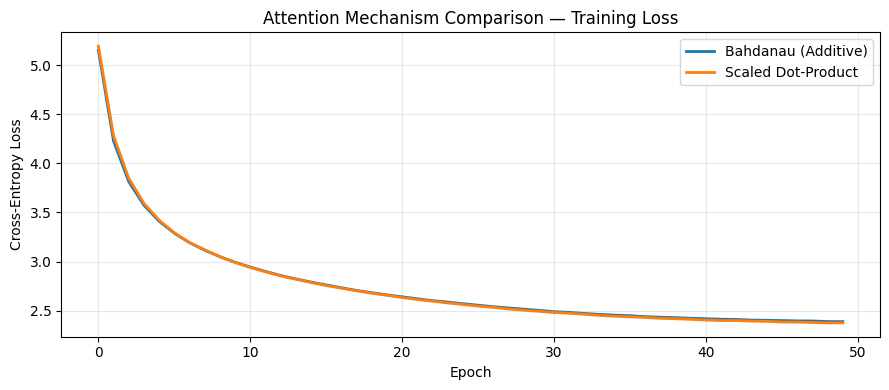


Metric                       Bahdanau      Dot-Product
------------------------------------------------------
Perplexity                      15.09            15.55
BLEU-1                         0.5900           0.5740
BLEU-2                         0.4136           0.3999
BLEU-3                         0.2789           0.2683
BLEU-4                         0.1872           0.1785


In [21]:
# Compare training curves and metrics: Bahdanau vs Dot-Product
plot_training_curves(
    {"Bahdanau (Additive)": satt_results["train_losses"],
     "Scaled Dot-Product":  dp_results["train_losses"]},
    title="Attention Mechanism Comparison — Training Loss"
)

print("\n{:<22} {:>14} {:>16}".format("Metric", "Bahdanau", "Dot-Product"))
print("-" * 54)
print("{:<22} {:>14.2f} {:>16.2f}".format(
    "Perplexity", satt_results["perplexity"], dp_results["perplexity"]))
for k in ["BLEU-1", "BLEU-2", "BLEU-3", "BLEU-4"]:
    print("{:<22} {:>14.4f} {:>16.4f}".format(
        k, satt_results["bleu"][k], dp_results["bleu"][k]))

**Observation (fill in after running):**  
*Discuss convergence speed, final BLEU, and whether one attention type produces qualitatively better captions.*


## Additional Task 4: Transformer-Based Decoder (Hard)

**Hypothesis:** A transformer decoder with multi-head cross-attention to the spatial image features can model long-range dependencies more effectively than an LSTM, potentially achieving higher BLEU scores.

**Experiment:** Re-use the same `ShowAttendTellEncoder` (spatial 49×512 features) and replace the LSTM with a stack of `nn.TransformerDecoderLayer`s. Compare training curves and BLEU against both LSTM models.


In [22]:
# ── Transformer-based Captioner ─────────────────────────────────────────────
class TransformerDecoder(nn.Module):
    """
    Transformer decoder for image captioning.
    - Memory: spatial image features from ShowAttendTellEncoder → (B, 49, 512)
    - Target: token embeddings + sinusoidal-style learnable positional encoding
    - Outputs token logits (B, T-1, vocab_size) during training,
      greedy token ids (B, max_len) during inference.
    """
    def __init__(self, vocab_size: int, encoder_dim: int = 512,
                 embed_dim: int = 256, nhead: int = 4,
                 num_layers: int = 3, ffn_dim: int = 1024,
                 dropout: float = 0.1, max_pos: int = 60,
                 pad_idx: int = 0):
        super().__init__()
        assert embed_dim % nhead == 0, "embed_dim must be divisible by nhead"
        self.pad_idx  = pad_idx
        self.embed    = nn.Embedding(vocab_size, embed_dim, padding_idx=pad_idx)
        self.pos_emb  = nn.Embedding(max_pos, embed_dim)
        self.enc_proj = nn.Linear(encoder_dim, embed_dim)
        dec_layer = nn.TransformerDecoderLayer(
            d_model=embed_dim, nhead=nhead, dim_feedforward=ffn_dim,
            dropout=dropout, batch_first=True, norm_first=True,
        )
        self.decoder = nn.TransformerDecoder(dec_layer, num_layers=num_layers,
                                              norm=nn.LayerNorm(embed_dim))
        self.fc      = nn.Linear(embed_dim, vocab_size)
        self.drop    = nn.Dropout(dropout)
        self._init_weights()

    def _init_weights(self):
        nn.init.normal_(self.embed.weight, std=0.02)
        nn.init.normal_(self.pos_emb.weight, std=0.02)

    @staticmethod
    def _causal_mask(sz: int, device) -> torch.Tensor:
        return torch.triu(torch.ones(sz, sz, device=device, dtype=torch.bool), diagonal=1)

    def forward(self, enc_out: torch.Tensor, captions: torch.Tensor) -> torch.Tensor:
        """
        enc_out  : (B, num_pixels, encoder_dim)  — from spatial encoder
        captions : (B, max_len)  — includes BOS; target is captions[:, 1:]
        """
        B, device = captions.size(0), captions.device
        tgt = captions[:, :-1]                             # (B, T-1)
        T   = tgt.size(1)

        pos  = torch.arange(T, device=device).unsqueeze(0).expand(B, -1)
        x    = self.drop(self.embed(tgt) + self.pos_emb(pos))   # (B, T-1, E)

        mem  = self.enc_proj(enc_out)                      # (B, P, E)
        mask = self._causal_mask(T, device)
        pad_mask = (tgt == self.pad_idx)                   # (B, T-1) — True = ignore

        out  = self.decoder(x, mem, tgt_mask=mask, tgt_key_padding_mask=pad_mask)
        return self.fc(out)                                # (B, T-1, V)

    @torch.no_grad()
    def generate(self, enc_out: torch.Tensor, tokenizer, max_len: int = 35) -> torch.Tensor:
        self.eval()
        B, device = enc_out.size(0), enc_out.device
        mem = self.enc_proj(enc_out)                       # (B, P, E)
        generated = torch.full((B, 1), tokenizer.bos_idx, dtype=torch.long, device=device)

        for step in range(max_len):
            T   = generated.size(1)
            pos = torch.arange(T, device=device).unsqueeze(0).expand(B, -1)
            x   = self.embed(generated) + self.pos_emb(pos)
            msk = self._causal_mask(T, device)
            out = self.decoder(x, mem, tgt_mask=msk)
            nxt = self.fc(out[:, -1]).argmax(-1, keepdim=True)   # (B, 1)
            generated = torch.cat([generated, nxt], dim=1)
            if (nxt == tokenizer.eos_idx).all():
                break

        return generated[:, 1:]   # strip BOS  →  (B, ≤max_len)


# Shared spatial encoder (same weights as SATT for fair comparison)
tr_encoder = ShowAttendTellEncoder(freeze=SATT_FREEZE_ENC).to(DEVICE)
tr_decoder = TransformerDecoder(
    vocab_size=len(tokenizer),
    encoder_dim=SATT_ENCODER_DIM,
    embed_dim=256,
    nhead=4,
    num_layers=3,
    ffn_dim=1024,
    dropout=0.1,
    max_pos=MAX_LEN + 5,
    pad_idx=PAD_IDX,
).to(DEVICE)

total_params = sum(p.numel() for p in list(tr_encoder.parameters()) + list(tr_decoder.parameters()))
print(f"Transformer Captioner total params: {total_params:,}")

tr_results = run_training(
    encoder=tr_encoder,
    decoder=tr_decoder,
    train_loader=train_loader,
    test_loader=test_loader,
    tokenizer=tokenizer,
    device=DEVICE,
    n_epochs=SATT_N_EPOCHS,
    lr=1e-4,                  # transformers prefer a lower, warmed-up lr
    weight_decay=1e-4,
    captions_map=test_captions_map,
    model_name="TransformerDecoder",
)

Transformer Captioner total params: 15,839,129
 Training: TransformerDecoder
------------------------------------------------------------------------
 device          : cuda
 AMP             : True (torch.bfloat16)
 epochs          : 50
 lr / wd         : 1.00e-04 / 1.00e-04
 train batches   : 64   (batch_size=512)
 val batches     : 4
 encoder params  : 0 trainable
 decoder params  : 4,662,617 trainable
 eval_every      : 1    bleu_every: 0    sample_every: 0


[TransformerDecoder] Epoch 1/50:   0%|                                                                        …

[TransformerDecoder] Epoch 01/50 | train_loss=5.9797 acc=17.78% | gnorm μ=1.69 max=4.04 | lr=1.00e-04 | 69.7s | val_loss=5.0447 ppl=155.21 acc=24.30%  ← new best


[TransformerDecoder] Epoch 2/50:   0%|                                                                        …

[TransformerDecoder] Epoch 02/50 | train_loss=4.7460 acc=25.29% | gnorm μ=0.74 max=1.04 | lr=9.99e-05 | 69.1s | val_loss=4.3669 ppl=78.22 acc=27.76%  ← new best


[TransformerDecoder] Epoch 3/50:   0%|                                                                        …

[TransformerDecoder] Epoch 03/50 | train_loss=4.2773 acc=28.69% | gnorm μ=0.60 max=1.03 | lr=9.96e-05 | 70.5s | val_loss=4.0443 ppl=56.73 acc=31.08%  ← new best


[TransformerDecoder] Epoch 4/50:   0%|                                                                        …

[TransformerDecoder] Epoch 04/50 | train_loss=3.9859 acc=31.09% | gnorm μ=0.62 max=1.23 | lr=9.92e-05 | 70.0s | val_loss=3.8548 ppl=46.68 acc=32.04%  ← new best


[TransformerDecoder] Epoch 5/50:   0%|                                                                        …

[TransformerDecoder] Epoch 05/50 | train_loss=3.7937 acc=32.62% | gnorm μ=0.65 max=1.21 | lr=9.86e-05 | 70.1s | val_loss=3.6721 ppl=39.36 acc=33.80%  ← new best


[TransformerDecoder] Epoch 6/50:   0%|                                                                        …

[TransformerDecoder] Epoch 06/50 | train_loss=3.6462 acc=33.82% | gnorm μ=0.72 max=1.31 | lr=9.78e-05 | 70.8s | val_loss=3.4963 ppl=33.45 acc=34.98%  ← new best


[TransformerDecoder] Epoch 7/50:   0%|                                                                        …

[TransformerDecoder] Epoch 07/50 | train_loss=3.5247 acc=34.80% | gnorm μ=0.71 max=1.23 | lr=9.68e-05 | 72.2s | val_loss=3.4143 ppl=30.46 acc=35.90%  ← new best


[TransformerDecoder] Epoch 8/50:   0%|                                                                        …

[TransformerDecoder] Epoch 08/50 | train_loss=3.4222 acc=35.57% | gnorm μ=0.71 max=1.41 | lr=9.57e-05 | 69.7s | val_loss=3.3560 ppl=28.85 acc=36.82%  ← new best


[TransformerDecoder] Epoch 9/50:   0%|                                                                        …

[TransformerDecoder] Epoch 09/50 | train_loss=3.3365 acc=36.31% | gnorm μ=0.76 max=1.34 | lr=9.44e-05 | 71.0s | val_loss=3.2810 ppl=26.63 acc=37.23%  ← new best


[TransformerDecoder] Epoch 10/50:   0%|                                                                       …

[TransformerDecoder] Epoch 10/50 | train_loss=3.2621 acc=36.95% | gnorm μ=0.79 max=1.40 | lr=9.30e-05 | 71.1s | val_loss=3.2338 ppl=25.47 acc=36.89%  ← new best


[TransformerDecoder] Epoch 11/50:   0%|                                                                       …

[TransformerDecoder] Epoch 11/50 | train_loss=3.1955 acc=37.55% | gnorm μ=0.75 max=1.51 | lr=9.14e-05 | 71.3s | val_loss=3.1631 ppl=23.88 acc=37.98%  ← new best


[TransformerDecoder] Epoch 12/50:   0%|                                                                       …

[TransformerDecoder] Epoch 12/50 | train_loss=3.1407 acc=38.08% | gnorm μ=0.82 max=1.65 | lr=8.97e-05 | 70.0s | val_loss=3.1501 ppl=22.74 acc=38.39%  ← new best


[TransformerDecoder] Epoch 13/50:   0%|                                                                       …

[TransformerDecoder] Epoch 13/50 | train_loss=3.0849 acc=38.49% | gnorm μ=0.79 max=1.51 | lr=8.78e-05 | 72.8s | val_loss=3.0467 ppl=20.97 acc=39.05%  ← new best


[TransformerDecoder] Epoch 14/50:   0%|                                                                       …

[TransformerDecoder] Epoch 14/50 | train_loss=3.0413 acc=38.88% | gnorm μ=0.79 max=1.54 | lr=8.58e-05 | 72.5s | val_loss=3.0770 ppl=21.86 acc=38.11%


[TransformerDecoder] Epoch 15/50:   0%|                                                                       …

[TransformerDecoder] Epoch 15/50 | train_loss=2.9994 acc=39.29% | gnorm μ=0.82 max=1.45 | lr=8.37e-05 | 71.1s | val_loss=3.0425 ppl=20.59 acc=39.15%  ← new best


[TransformerDecoder] Epoch 16/50:   0%|                                                                       …

[TransformerDecoder] Epoch 16/50 | train_loss=2.9617 acc=39.70% | gnorm μ=0.81 max=1.61 | lr=8.15e-05 | 70.2s | val_loss=2.9889 ppl=19.99 acc=39.26%  ← new best


[TransformerDecoder] Epoch 17/50:   0%|                                                                       …

[TransformerDecoder] Epoch 17/50 | train_loss=2.9284 acc=39.97% | gnorm μ=0.84 max=1.54 | lr=7.91e-05 | 70.1s | val_loss=2.9999 ppl=19.84 acc=39.44%


[TransformerDecoder] Epoch 18/50:   0%|                                                                       …

[TransformerDecoder] Epoch 18/50 | train_loss=2.8980 acc=40.30% | gnorm μ=0.83 max=1.48 | lr=7.67e-05 | 70.3s | val_loss=2.9632 ppl=19.20 acc=39.39%  ← new best


[TransformerDecoder] Epoch 19/50:   0%|                                                                       …

[TransformerDecoder] Epoch 19/50 | train_loss=2.8675 acc=40.59% | gnorm μ=0.84 max=1.71 | lr=7.42e-05 | 71.3s | val_loss=2.9356 ppl=18.55 acc=39.94%  ← new best


[TransformerDecoder] Epoch 20/50:   0%|                                                                       …

[TransformerDecoder] Epoch 20/50 | train_loss=2.8422 acc=40.83% | gnorm μ=0.85 max=1.65 | lr=7.16e-05 | 70.1s | val_loss=2.9378 ppl=18.75 acc=39.59%


[TransformerDecoder] Epoch 21/50:   0%|                                                                       …

[TransformerDecoder] Epoch 21/50 | train_loss=2.8184 acc=41.09% | gnorm μ=0.86 max=1.75 | lr=6.89e-05 | 69.4s | val_loss=2.9016 ppl=18.06 acc=40.04%  ← new best


[TransformerDecoder] Epoch 22/50:   0%|                                                                       …

[TransformerDecoder] Epoch 22/50 | train_loss=2.7947 acc=41.29% | gnorm μ=0.87 max=1.56 | lr=6.62e-05 | 71.3s | val_loss=2.8756 ppl=17.91 acc=40.19%  ← new best


[TransformerDecoder] Epoch 23/50:   0%|                                                                       …

[TransformerDecoder] Epoch 23/50 | train_loss=2.7728 acc=41.59% | gnorm μ=0.89 max=1.74 | lr=6.34e-05 | 69.9s | val_loss=2.9223 ppl=17.96 acc=40.38%


[TransformerDecoder] Epoch 24/50:   0%|                                                                       …

[TransformerDecoder] Epoch 24/50 | train_loss=2.7535 acc=41.67% | gnorm μ=0.88 max=1.67 | lr=6.06e-05 | 70.8s | val_loss=2.9044 ppl=18.17 acc=39.90%


[TransformerDecoder] Epoch 25/50:   0%|                                                                       …

[TransformerDecoder] Epoch 25/50 | train_loss=2.7373 acc=41.85% | gnorm μ=0.88 max=1.78 | lr=5.78e-05 | 70.3s | val_loss=2.8667 ppl=17.48 acc=40.27%  ← new best


[TransformerDecoder] Epoch 26/50:   0%|                                                                       …

[TransformerDecoder] Epoch 26/50 | train_loss=2.7199 acc=42.09% | gnorm μ=0.89 max=1.82 | lr=5.50e-05 | 69.8s | val_loss=2.8662 ppl=17.47 acc=40.14%  ← new best


[TransformerDecoder] Epoch 27/50:   0%|                                                                       …

[TransformerDecoder] Epoch 27/50 | train_loss=2.7021 acc=42.30% | gnorm μ=0.89 max=1.83 | lr=5.22e-05 | 71.6s | val_loss=2.8603 ppl=17.05 acc=40.77%  ← new best


[TransformerDecoder] Epoch 28/50:   0%|                                                                       …

[TransformerDecoder] Epoch 28/50 | train_loss=2.6908 acc=42.43% | gnorm μ=0.89 max=2.01 | lr=4.94e-05 | 70.7s | val_loss=2.8790 ppl=17.44 acc=40.26%


[TransformerDecoder] Epoch 29/50:   0%|                                                                       …

[TransformerDecoder] Epoch 29/50 | train_loss=2.6773 acc=42.50% | gnorm μ=0.91 max=2.08 | lr=4.66e-05 | 70.3s | val_loss=2.8479 ppl=17.02 acc=40.51%  ← new best


[TransformerDecoder] Epoch 30/50:   0%|                                                                       …

[TransformerDecoder] Epoch 30/50 | train_loss=2.6641 acc=42.71% | gnorm μ=0.92 max=1.81 | lr=4.38e-05 | 71.0s | val_loss=2.8389 ppl=16.62 acc=40.80%  ← new best


[TransformerDecoder] Epoch 31/50:   0%|                                                                       …

[TransformerDecoder] Epoch 31/50 | train_loss=2.6531 acc=42.74% | gnorm μ=0.91 max=1.91 | lr=4.11e-05 | 69.8s | val_loss=2.8176 ppl=16.68 acc=40.71%  ← new best


[TransformerDecoder] Epoch 32/50:   0%|                                                                       …

[TransformerDecoder] Epoch 32/50 | train_loss=2.6415 acc=42.93% | gnorm μ=0.90 max=1.76 | lr=3.84e-05 | 70.7s | val_loss=2.8634 ppl=17.11 acc=40.23%


[TransformerDecoder] Epoch 33/50:   0%|                                                                       …

[TransformerDecoder] Epoch 33/50 | train_loss=2.6328 acc=42.98% | gnorm μ=0.92 max=1.92 | lr=3.58e-05 | 71.6s | val_loss=2.8404 ppl=16.77 acc=40.58%


[TransformerDecoder] Epoch 34/50:   0%|                                                                       …

[TransformerDecoder] Epoch 34/50 | train_loss=2.6219 acc=43.10% | gnorm μ=0.92 max=1.83 | lr=3.33e-05 | 70.4s | val_loss=2.8455 ppl=16.77 acc=40.65%


[TransformerDecoder] Epoch 35/50:   0%|                                                                       …

[TransformerDecoder] Epoch 35/50 | train_loss=2.6147 acc=43.23% | gnorm μ=0.91 max=1.88 | lr=3.09e-05 | 85.5s | val_loss=2.7795 ppl=15.88 acc=41.33%  ← new best


[TransformerDecoder] Epoch 36/50:   0%|                                                                       …

[TransformerDecoder] Epoch 36/50 | train_loss=2.6034 acc=43.38% | gnorm μ=0.91 max=1.84 | lr=2.85e-05 | 85.9s | val_loss=2.8114 ppl=16.44 acc=41.18%


[TransformerDecoder] Epoch 37/50:   0%|                                                                       …

[TransformerDecoder] Epoch 37/50 | train_loss=2.5988 acc=43.41% | gnorm μ=0.92 max=1.86 | lr=2.63e-05 | 84.4s | val_loss=2.8141 ppl=16.48 acc=41.02%


[TransformerDecoder] Epoch 38/50:   0%|                                                                       …

[TransformerDecoder] Epoch 38/50 | train_loss=2.5906 acc=43.46% | gnorm μ=0.92 max=1.88 | lr=2.42e-05 | 83.6s | val_loss=2.7734 ppl=15.95 acc=40.82%  ← new best


[TransformerDecoder] Epoch 39/50:   0%|                                                                       …

[TransformerDecoder] Epoch 39/50 | train_loss=2.5850 acc=43.49% | gnorm μ=0.91 max=1.99 | lr=2.22e-05 | 89.1s | val_loss=2.8073 ppl=16.35 acc=41.33%


[TransformerDecoder] Epoch 40/50:   0%|                                                                       …

[TransformerDecoder] Epoch 40/50 | train_loss=2.5824 acc=43.57% | gnorm μ=0.93 max=1.89 | lr=2.03e-05 | 84.2s | val_loss=2.8001 ppl=16.27 acc=41.19%


[TransformerDecoder] Epoch 41/50:   0%|                                                                       …

[TransformerDecoder] Epoch 41/50 | train_loss=2.5761 acc=43.71% | gnorm μ=0.92 max=1.88 | lr=1.86e-05 | 79.1s | val_loss=2.7647 ppl=15.99 acc=41.13%  ← new best


[TransformerDecoder] Epoch 42/50:   0%|                                                                       …

[TransformerDecoder] Epoch 42/50 | train_loss=2.5705 acc=43.71% | gnorm μ=0.93 max=1.94 | lr=1.70e-05 | 82.1s | val_loss=2.7767 ppl=15.97 acc=41.12%


[TransformerDecoder] Epoch 43/50:   0%|                                                                       …

[TransformerDecoder] Epoch 43/50 | train_loss=2.5666 acc=43.69% | gnorm μ=0.93 max=2.01 | lr=1.56e-05 | 79.6s | val_loss=2.8067 ppl=16.42 acc=40.40%


[TransformerDecoder] Epoch 44/50:   0%|                                                                       …

[TransformerDecoder] Epoch 44/50 | train_loss=2.5608 acc=43.87% | gnorm μ=0.92 max=1.94 | lr=1.43e-05 | 83.0s | val_loss=2.7927 ppl=15.69 acc=41.24%


[TransformerDecoder] Epoch 45/50:   0%|                                                                       …

[TransformerDecoder] Epoch 45/50 | train_loss=2.5575 acc=43.89% | gnorm μ=0.93 max=1.99 | lr=1.32e-05 | 81.9s | val_loss=2.7818 ppl=16.09 acc=40.95%


[TransformerDecoder] Epoch 46/50:   0%|                                                                       …

[TransformerDecoder] Epoch 46/50 | train_loss=2.5602 acc=43.89% | gnorm μ=0.93 max=1.90 | lr=1.22e-05 | 81.0s | val_loss=2.7998 ppl=16.24 acc=40.93%


[TransformerDecoder] Epoch 47/50:   0%|                                                                       …

[TransformerDecoder] Epoch 47/50 | train_loss=2.5525 acc=43.91% | gnorm μ=0.92 max=1.89 | lr=1.14e-05 | 82.3s | val_loss=2.7751 ppl=15.78 acc=40.92%


[TransformerDecoder] Epoch 48/50:   0%|                                                                       …

[TransformerDecoder] Epoch 48/50 | train_loss=2.5524 acc=43.99% | gnorm μ=0.92 max=1.98 | lr=1.08e-05 | 83.4s | val_loss=2.8237 ppl=16.11 acc=41.10%


[TransformerDecoder] Epoch 49/50:   0%|                                                                       …

[TransformerDecoder] Epoch 49/50 | train_loss=2.5481 acc=43.98% | gnorm μ=0.93 max=1.96 | lr=1.04e-05 | 81.6s | val_loss=2.7999 ppl=16.25 acc=40.99%


[TransformerDecoder] Epoch 50/50:   0%|                                                                       …

[TransformerDecoder] Epoch 50/50 | train_loss=2.5470 acc=44.01% | gnorm μ=0.94 max=1.87 | lr=1.01e-05 | 84.1s | val_loss=2.7803 ppl=15.60 acc=41.24%
------------------------------------------------------------------------
 Training finished in 65.7 min (78.8s/epoch on average)


BLEU:   0%|                                                                                                   …


[TransformerDecoder] Final Perplexity: 15.80
   BLEU-1: 0.5649
   BLEU-2: 0.3894
   BLEU-3: 0.2604
   BLEU-4: 0.1750


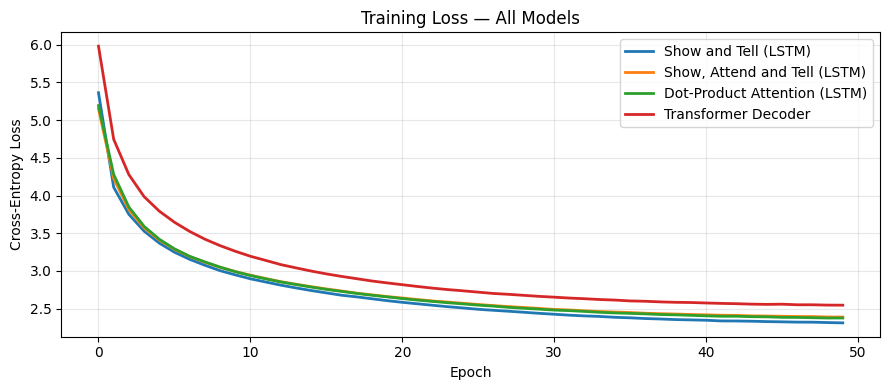

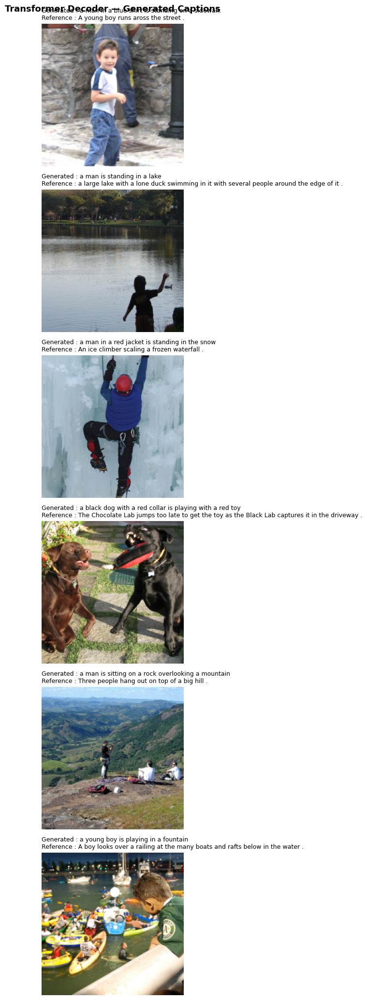


Metric                       M1 (SaT) M2 (SATaT)  M3 (DotPrd)   M4 (Transf.)
----------------------------------------------------------------------------
Perplexity                      15.28      15.09        15.55          15.80
BLEU-1                         0.5874     0.5900       0.5740         0.5649
BLEU-2                         0.4052     0.4136       0.3999         0.3894
BLEU-3                         0.2708     0.2789       0.2683         0.2604
BLEU-4                         0.1794     0.1872       0.1785         0.1750


In [23]:
# All four models compared (LSTM + Attention LSTM + DotProduct + Transformer)
plot_training_curves(
    {"Show and Tell (LSTM)":          sat_results["train_losses"],
     "Show, Attend and Tell (LSTM)":  satt_results["train_losses"],
     "Dot-Product Attention (LSTM)":  dp_results["train_losses"],
     "Transformer Decoder":           tr_results["train_losses"]},
    title="Training Loss — All Models"
)

# Sample captions from the transformer
show_sample_captions(tr_encoder, tr_decoder, test_loader, tokenizer, DEVICE, n=6,
                     title="Transformer Decoder — Generated Captions")

# Final metric table — all four models
print("\n{:<26} {:>10} {:>10} {:>12} {:>14}".format(
    "Metric", "M1 (SaT)", "M2 (SATaT)", "M3 (DotPrd)", "M4 (Transf.)"))
print("-" * 76)
print("{:<26} {:>10.2f} {:>10.2f} {:>12.2f} {:>14.2f}".format(
    "Perplexity",
    sat_results["perplexity"], satt_results["perplexity"],
    dp_results["perplexity"], tr_results["perplexity"]))
for k in ["BLEU-1", "BLEU-2", "BLEU-3", "BLEU-4"]:
    print("{:<26} {:>10.4f} {:>10.4f} {:>12.4f} {:>14.4f}".format(
        k,
        sat_results["bleu"][k], satt_results["bleu"][k],
        dp_results["bleu"][k],  tr_results["bleu"][k]))


**Observation (fill in after running):**  
*Discuss differences in convergence, final BLEU, qualitative caption quality, and what you think drives any gap between the LSTM and transformer decoders on this relatively small dataset.*


## Additional Task 5: Pretrained Word Embeddings (GloVe)

**Hypothesis:** On a small dataset like Flickr8k (~6k training images), the word embedding layer has to be learned from very limited language signal. Initializing it from GloVe vectors pretrained on much larger corpora should give the model meaningful word-similarity structure for free, leading to faster convergence and/or better final BLEU.

**Experiment:** Train two variants of *Show and Tell* with `embed_dim=100`:
1. **Control** — random embedding init.
2. **GloVe** — embedding layer initialized from GloVe 6B 100d vectors for vocabulary tokens that appear in GloVe, and random-initialized for the rest. Embeddings are *fine-tuned* (not frozen).

Both variants use identical architecture and hyperparameters; only the embedding initialization differs.


In [24]:
# [batch] dataset assumed pre-staged in ./data - download skipped
import os
target_dir = os.path.join(os.getcwd(), 'data')
print('[batch] using dataset at', target_dir)


[batch] using dataset at /cluster/home/magilolg/neural-image-captioning-main/captioning_starter/data


<span id="papermill-error-cell" style="color:red; font-family:Helvetica Neue, Helvetica, Arial, sans-serif; font-size:2em;">Execution using papermill encountered an exception here and stopped:</span>

In [25]:
# ── Train two SaT variants at embed_dim=100 ────────────────────────────────
# Same architecture, same hyperparameters — only the initialization changes.
GLOVE_EMBED_DIM     = GLOVE_DIM     # 100
GLOVE_N_EPOCHS      = SAT_N_EPOCHS
GLOVE_LR            = SAT_LR
GLOVE_WEIGHT_DECAY  = SAT_WEIGHT_DECAY

# (1) Control — random init, embed_dim=100
print("\n" + "=" * 72)
print(" CONTROL: Show and Tell, embed_dim=100, random embedding init")
print("=" * 72)
rand_encoder = ShowAndTellEncoder(encoder_dim=SAT_ENCODER_DIM, freeze=SAT_FREEZE_ENC).to(DEVICE)
rand_decoder = ShowAndTellDecoder(
    vocab_size=len(tokenizer),
    encoder_dim=SAT_ENCODER_DIM,
    embed_dim=GLOVE_EMBED_DIM,
    decoder_dim=SAT_DECODER_DIM,
    dropout=SAT_DROPOUT,
    pad_idx=PAD_IDX,
).to(DEVICE)
rand_results = run_training(
    encoder=rand_encoder, decoder=rand_decoder,
    train_loader=train_loader, test_loader=test_loader,
    tokenizer=tokenizer, device=DEVICE,
    n_epochs=GLOVE_N_EPOCHS, lr=GLOVE_LR, weight_decay=GLOVE_WEIGHT_DECAY,
    captions_map=test_captions_map, model_name="SaT_embed100_random",
)

# (2) GloVe-initialized — same model, embedding rows replaced before training
print("\n" + "=" * 72)
print(" GloVe: Show and Tell, embed_dim=100, GloVe embedding init (fine-tuned)")
print("=" * 72)
glove_encoder = ShowAndTellEncoder(encoder_dim=SAT_ENCODER_DIM, freeze=SAT_FREEZE_ENC).to(DEVICE)
glove_decoder = ShowAndTellDecoder(
    vocab_size=len(tokenizer),
    encoder_dim=SAT_ENCODER_DIM,
    embed_dim=GLOVE_EMBED_DIM,
    decoder_dim=SAT_DECODER_DIM,
    dropout=SAT_DROPOUT,
    pad_idx=PAD_IDX,
).to(DEVICE)
init_embedding_from_glove(glove_decoder.embed, tokenizer, GLOVE_VECTORS, freeze=False)
glove_results = run_training(
    encoder=glove_encoder, decoder=glove_decoder,
    train_loader=train_loader, test_loader=test_loader,
    tokenizer=tokenizer, device=DEVICE,
    n_epochs=GLOVE_N_EPOCHS, lr=GLOVE_LR, weight_decay=GLOVE_WEIGHT_DECAY,
    captions_map=test_captions_map, model_name="SaT_embed100_glove",
)


NameError: name 'GLOVE_DIM' is not defined

In [ ]:
# ── Compare random init vs GloVe init ──────────────────────────────────────
plot_training_curves(
    {"Random init (embed_dim=100)": rand_results["train_losses"],
     "GloVe init (embed_dim=100)":  glove_results["train_losses"]},
    title="GloVe vs Random Embedding Initialization — Training Loss"
)

# Also overlay val-loss curves if we have them
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
for name, res in [("Random init", rand_results), ("GloVe init", glove_results)]:
    h = res["history"]
    val = [v if v is not None else float("nan") for v in h["val_loss"]]
    axes[0].plot(range(1, len(h["train_loss"]) + 1), h["train_loss"], label=f"{name} (train)")
    axes[0].plot(range(1, len(val) + 1), val, label=f"{name} (val)", linestyle="--")
    ppl = [v if v is not None else float("nan") for v in h["val_ppl"]]
    axes[1].plot(range(1, len(ppl) + 1), ppl, label=name, linewidth=2)
axes[0].set_title("Loss"); axes[0].set_xlabel("epoch"); axes[0].legend(); axes[0].grid(alpha=0.3)
axes[1].set_title("Validation perplexity"); axes[1].set_xlabel("epoch")
axes[1].legend(); axes[1].grid(alpha=0.3)
plt.tight_layout(); plt.show()

# Metric comparison table
print("\n{:<22} {:>14} {:>14}".format("Metric", "Random init", "GloVe init"))
print("-" * 52)
print("{:<22} {:>14.2f} {:>14.2f}".format(
    "Perplexity", rand_results["perplexity"], glove_results["perplexity"]))
for k in ["BLEU-1", "BLEU-2", "BLEU-3", "BLEU-4"]:
    print("{:<22} {:>14.4f} {:>14.4f}".format(
        k, rand_results["bleu"][k], glove_results["bleu"][k]))

# Sample captions side by side (qualitative)
print("\n──────── GloVe variant — sample captions ────────")
show_sample_captions(glove_encoder, glove_decoder, test_loader, tokenizer, DEVICE,
                     n=4, title="SaT (GloVe-initialized) — Sample Captions")


**Observation (fill in after running):**  
*Compare convergence speed and final BLEU between the two variants. Did GloVe help, hurt, or make no difference? At what fraction of your vocab did GloVe coverage land (printed above), and does that match your expectations given Flickr8k's caption style?*


## Optional Tasks — Implemented Above

| Task | Where |
|------|-------|
| **Pretrained Word Embeddings (GloVe)** | Additional Task 5 — train Show and Tell with GloVe 6B 100d embeddings (auto-downloaded via kagglehub) and compare against a matched random-init control. |
| **Experiment Tracking (W&B)** | Integrated into `run_training()`. Set `USE_WANDB=True` at the top of the *Shared Utilities* cell, run `pip install wandb && wandb login`, and per-epoch metrics plus final summary statistics will be logged to a wandb project (default name: `flickr8k-captioning`). |
